In [1]:
print('Load libraries')

import glob
import os


import itertools

import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib.lines import Line2D
import matplotlib.lines as mlines

import statsmodels.api as sm
from scipy import stats

from sklearn.metrics import mean_squared_error
from scipy.optimize import curve_fit
from scipy.stats import linregress

import iris
import iris.quickplot as qplt
import iris.analysis
import iris.coord_categorisation as icoca
from iris.util import mask_cube_from_shapefile
from iris.util import promote_aux_coord_to_dim_coord
from iris.coords import AuxCoord

from typing import List

import cartopy.io.shapereader as shpreader

import pandas as pd
import seaborn as sns

from dataclasses import dataclass

from iris.util import unify_time_units
from iris.util import equalise_attributes

import cmocean

import warnings

import pickle

Load libraries


In [2]:
print('Load Custom Functions')

from Cube_Functions import *
from Plot_Functions import *
from Climate_Functions import *
from Stats_Functions import *
print('Finished loading libraries and functions')

Load Custom Functions
Finished loading libraries and functions


In [3]:
import dask.optimization

# Patch the missing class
if not hasattr(dask.optimization, 'SubgraphCallable'):
    class SubgraphCallable:
        def __init__(self, *args, **kwargs):
            pass
    dask.optimization.SubgraphCallable = SubgraphCallable


In [4]:
models = ['ACCESS-ESM1-5', 
        ###'AWI-ESM-1-1-LR',  # Needs regridding, as it's an unstructured mesh
        'CESM2',  #  ### - SSP585 different variant
        ###'CNRM-CM6-1',  # - No sithick for piControl, but has it for lig127k
        'EC-Earth3-LR',  # 
        'EC-Earth3',
        #'FGOALS-f3-L',  #     Can't find siconc for piControl, but has it for lig127k
        #'FGOALS-g3',  # Unrealistically highh SIA for the whole of this century
        'HadGEM3-GC3.1-LL',
        'IPSL-CM6A-LR',
        'MIROC-ES2L',
        'NESM3',
        'NorESM1-F']
        #'NorESM2-LM']  # ### No sithick for lig127k

#ocean only models
#models = ['ACCESS-ESM1-5', 'CESM2','EC-Earth3-LR', 'EC-Earth3', 'IPSL-CM6A-LR', 'NESM3']#, 'NorESM2-LM']


In [5]:
#Main parameters

experiment = 'lig127k'
control = 'piControl'

root_path = '/gws/nopw/j04/pmip4_vol1/public/matt/data/'

months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

t_seconds = 60 * 60 * 24 * 30

area_var = '60_land_mask'


In [6]:
#Calculate energy from melting
si_density = 917 #kgm-3
si_latent = 0.334 #MJ per kg
si_latent_volume = si_density * si_latent #MJ per m-3

In [7]:
with open('Energy_Budget_vars.pkl', 'rb') as f:
    recovered = pickle.load(f)
    experiment_energy_dict = recovered['experiment_energy_dict'] 
    experiment_si_dict = recovered['experiment_si_dict'] 
    experiment_albedo_dict = recovered['experiment_albedo_dict']
    control_energy_dict = recovered['control_energy_dict'] 
    control_si_dict = recovered['control_si_dict'] 
    control_albedo_dict = recovered['control_albedo_dict']
    anomaly_energy_dict = recovered['anomaly_energy_dict'] 
    anomaly_si_dict = recovered['anomaly_si_dict'] 
    anomaly_albedo_dict = recovered['anomaly_albedo_dict']

In [8]:
with open('Mass_Budget_Derived_vars.pkl', 'rb') as f:
    recovered = pickle.load(f)
    experiment_volume_dict = recovered['experiment_volume_dict']
    experiment_growth_dict = recovered['experiment_growth_dict']
    control_volume_dict = recovered['control_volume_dict']
    control_growth_dict = recovered['control_growth_dict']

In [9]:
with open('Area_vars.pkl', 'rb') as f:
    recovered = pickle.load(f)
    model_area_dict = recovered['model_area_dict']

In [10]:
with open('Ocean_Surface_Heat_vars.pkl', 'rb') as f:
    recovered = pickle.load(f)
    experiment_ocean_dict = recovered['experiment_ocean_dict']
    control_ocean_dict = recovered['control_ocean_dict']
    anomaly_ocean_dict = recovered['anomaly_ocean_dict']

In [11]:
anomaly_volume_dict = anomaly_dict(experiment_volume_dict, control_volume_dict)
anomaly_growth_dict = anomaly_dict(experiment_growth_dict, control_growth_dict)

In [12]:

models_set = set(models)

for name, obj in list(globals().items()):
    if isinstance(obj, dict):
        if name.endswith("_dict"):
            sorted_obj = dict(sorted(obj.items()))
            dict_keys = set(sorted_obj.keys())
    
            if models_set.issubset(dict_keys):
                keys_to_remove = [k for k in sorted_obj if k not in models_set]
                print(name)
                for k in keys_to_remove:
                    print('Removing ' + k)
                    del sorted_obj[k]
            else:
                print(name + ' is missing some models:')
                print(models_set - dict_keys)
    
            # Save the updated dict back to globals
            globals()[name] = sorted_obj


experiment_energy_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
experiment_si_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
experiment_albedo_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
control_energy_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
control_si_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
control_albedo_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
anomaly_energy_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
anomaly_si_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
anomaly_albedo_dict
Removing CNRM-CM6-1
Removing NorESM2-LM
experiment_volume_dict
experiment_growth_dict
control_volume_dict
control_growth_dict
model_area_dict
experiment_ocean_dict is missing some models:
{'MIROC-ES2L', 'NorESM1-F', 'HadGEM3-GC3.1-LL'}
control_ocean_dict is missing some models:
{'MIROC-ES2L', 'NorESM1-F', 'HadGEM3-GC3.1-LL'}
anomaly_ocean_dict is missing some models:
{'MIROC-ES2L', 'NorESM1-F', 'HadGEM3-GC3.1-LL'}
anomaly_volume_dict
anomaly_growth_dict


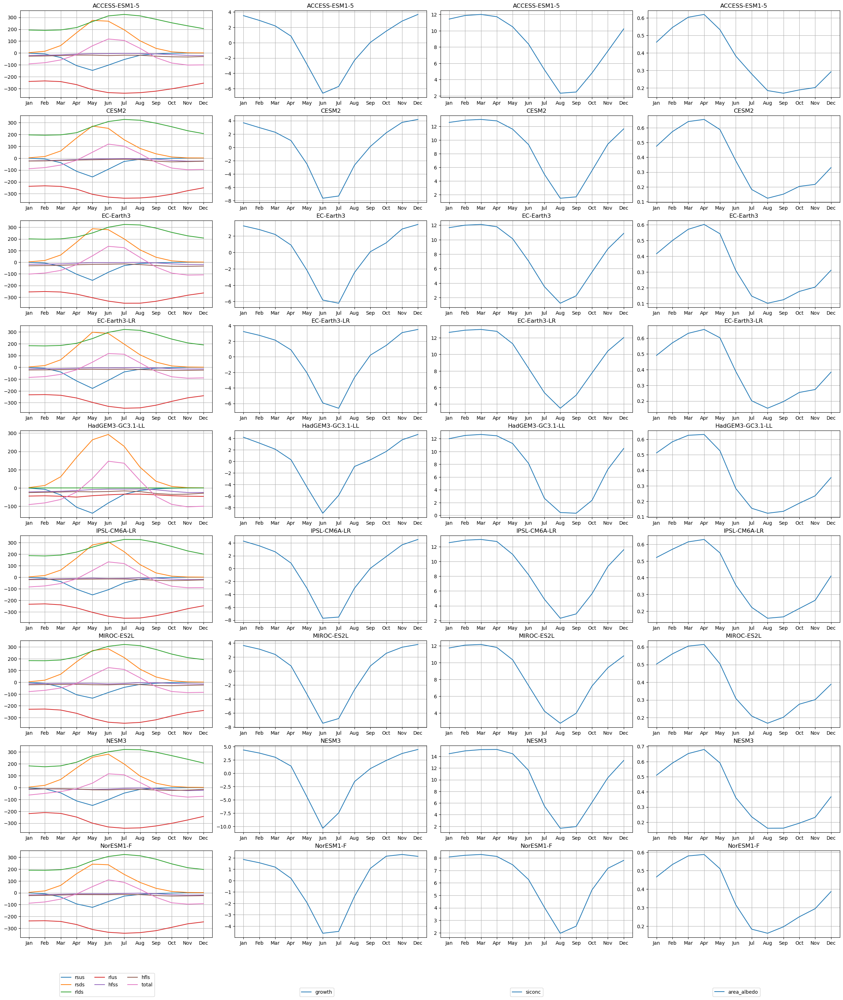

In [13]:
plot_grid(experiment_energy_dict, experiment_growth_dict, experiment_si_dict, experiment_albedo_dict)

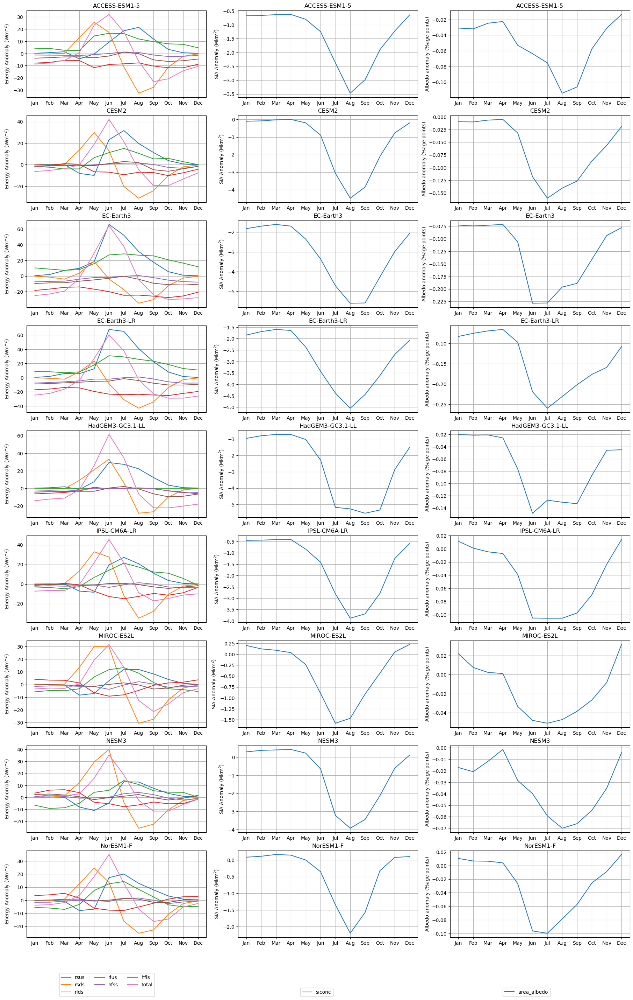

In [14]:
plot_grid(anomaly_energy_dict, anomaly_si_dict, anomaly_albedo_dict, 
          ylabels=['Energy Anomaly (Wm$^{-2}$)', 'SIA Anomaly (Mkm$^2$)', 'Albedo anomaly (%age points)'],
         save_name = 'grid_anomaly_energy_SIA_albedo')

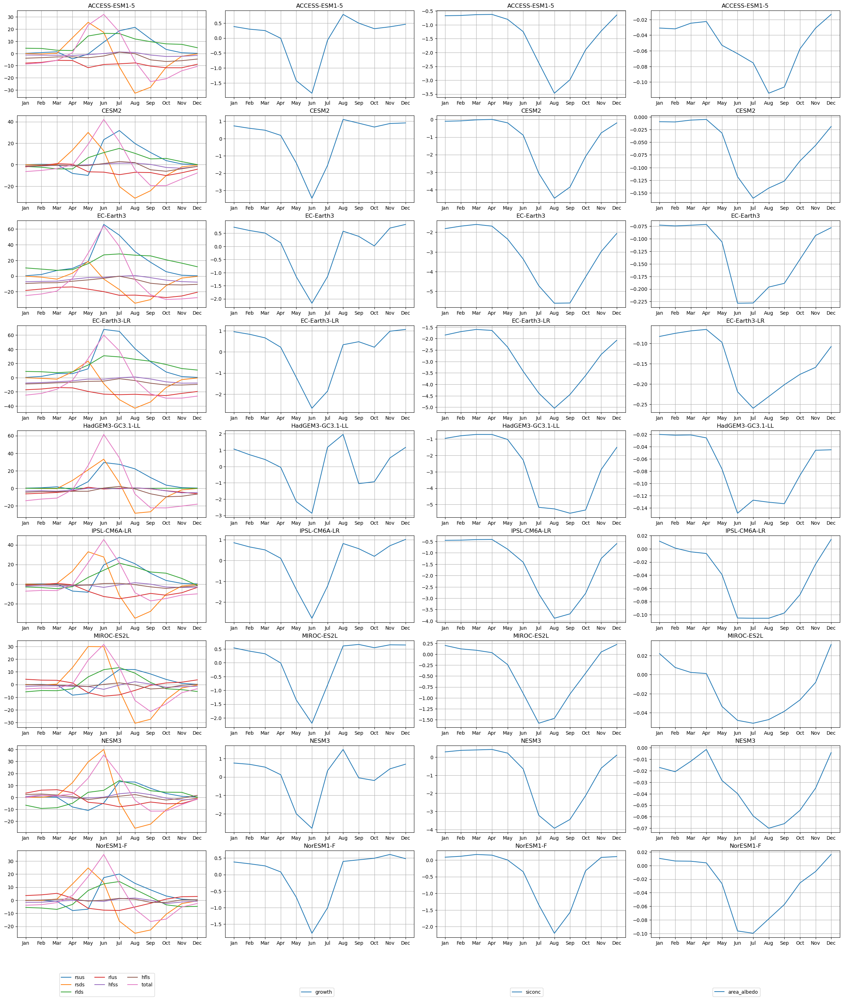

In [15]:
plot_grid(anomaly_energy_dict, anomaly_growth_dict, anomaly_si_dict, anomaly_albedo_dict)

#column 1
#combine long wave and latent heat terms into 'other'

#column 2
#plot rsds + error shading in one chart
#on same chart plot melt BUT as percentage of Mar total volume (or some other normalization)

In [16]:
anomaly_energy_dict_2 = combine_variables(anomaly_energy_dict, ['rlus', 'rlds'], 'lw_total')
anomaly_energy_dict_3 = combine_variables(anomaly_energy_dict, ['rlus', 'rlds', 'hfss', 'hfls'], 'other')

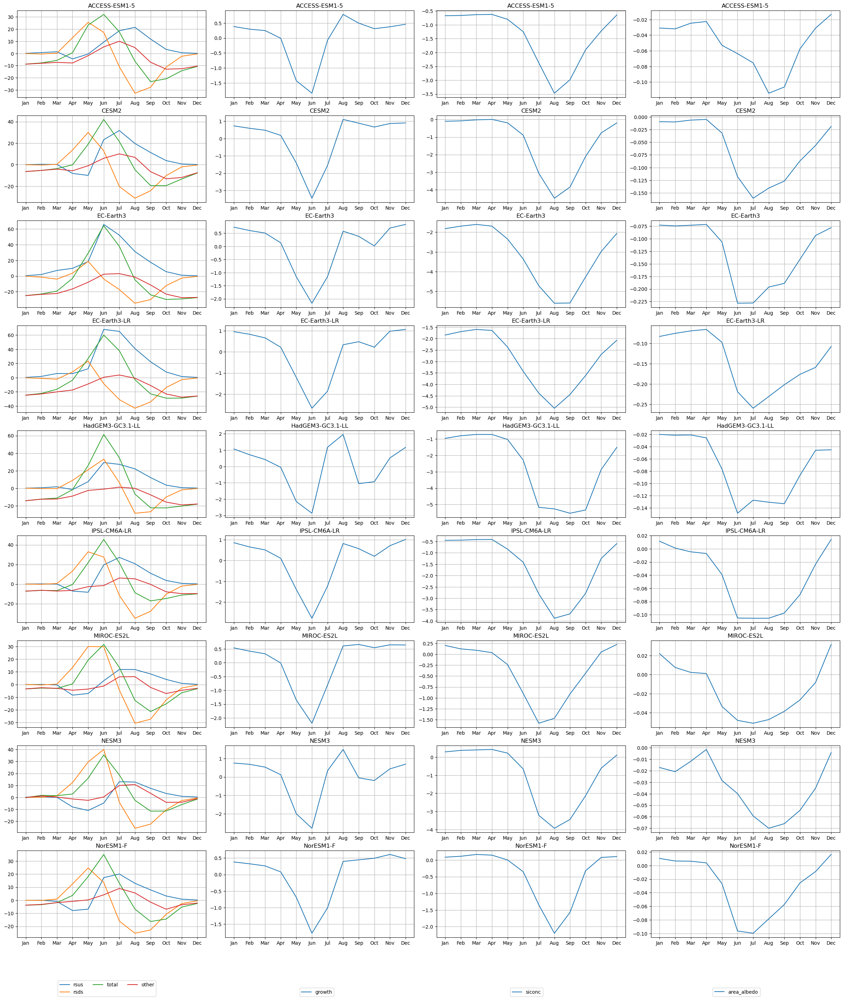

In [17]:
plot_grid(anomaly_energy_dict_3, anomaly_growth_dict, anomaly_si_dict, anomaly_albedo_dict)

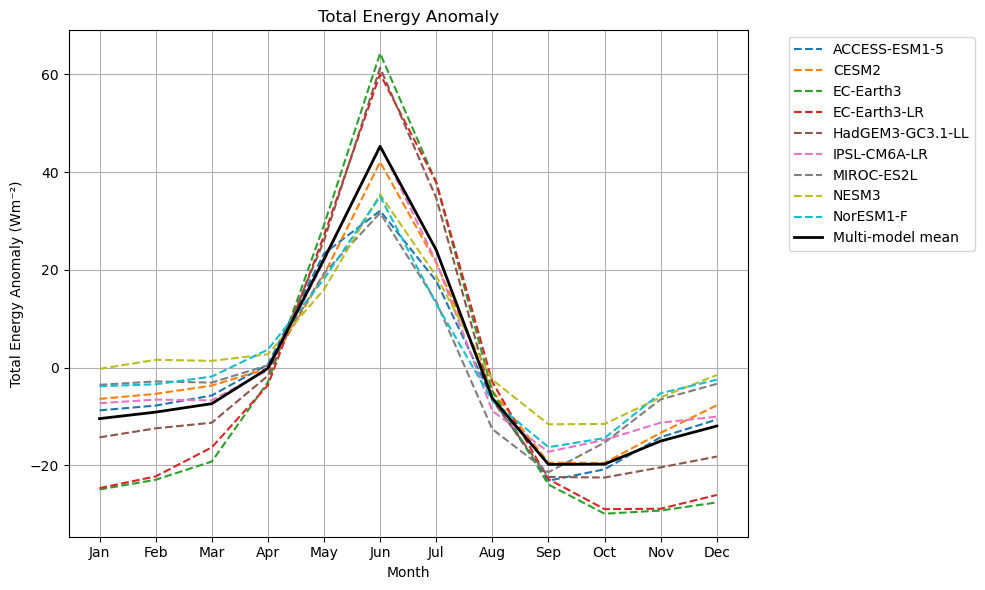

In [18]:
total_energy_mmm = plot_multi_model_mean(anomaly_energy_dict, 'total', title='Total Energy Anomaly', ylabel = 'Total Energy Anomaly (Wm⁻²)', save_name ='mmm_total')

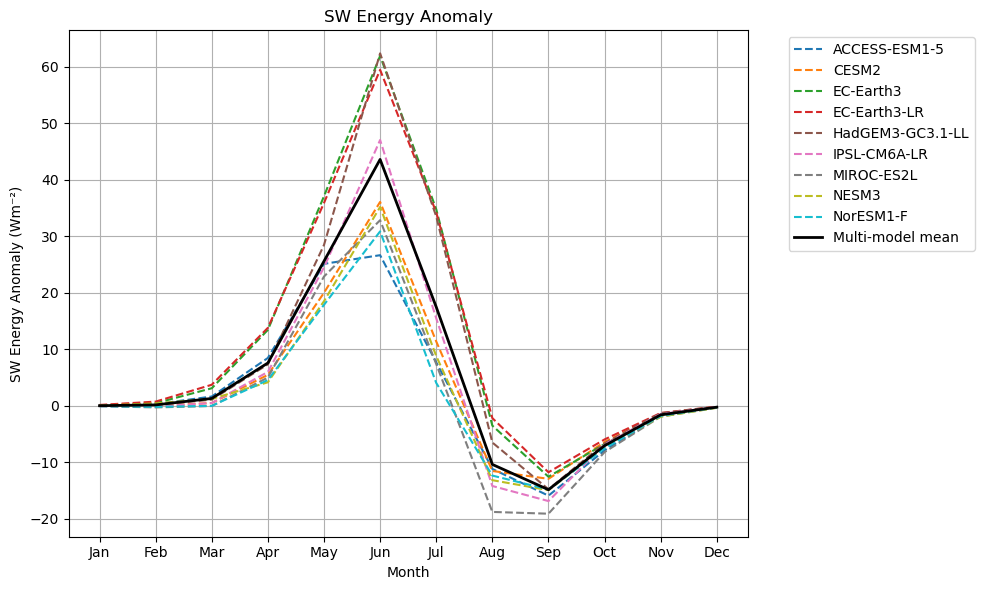

In [19]:
anomaly_energy_dict_sw = combine_variables(anomaly_energy_dict, ['rsus', 'rsds'], 'sw_total')
sw_total_energy_mmm = plot_multi_model_mean(anomaly_energy_dict_sw, 'sw_total', title='SW Energy Anomaly', ylabel = 'SW Energy Anomaly (Wm⁻²)', save_name ='mmm_sw_total')

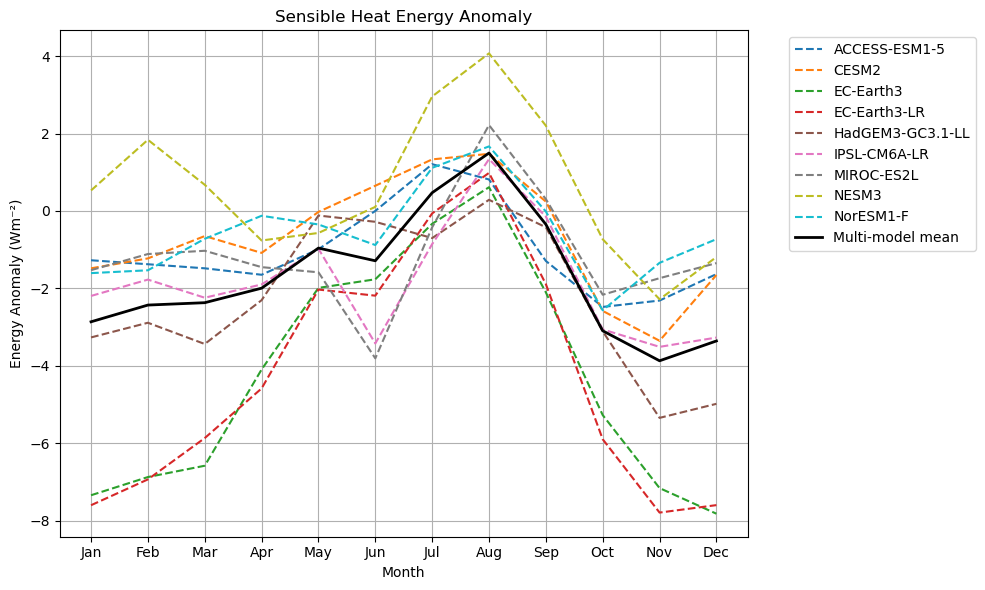

In [20]:
hfss_energy_mmm = plot_multi_model_mean(anomaly_energy_dict, 'hfss', title='Sensible Heat Energy Anomaly', ylabel = 'Energy Anomaly (Wm⁻²)')

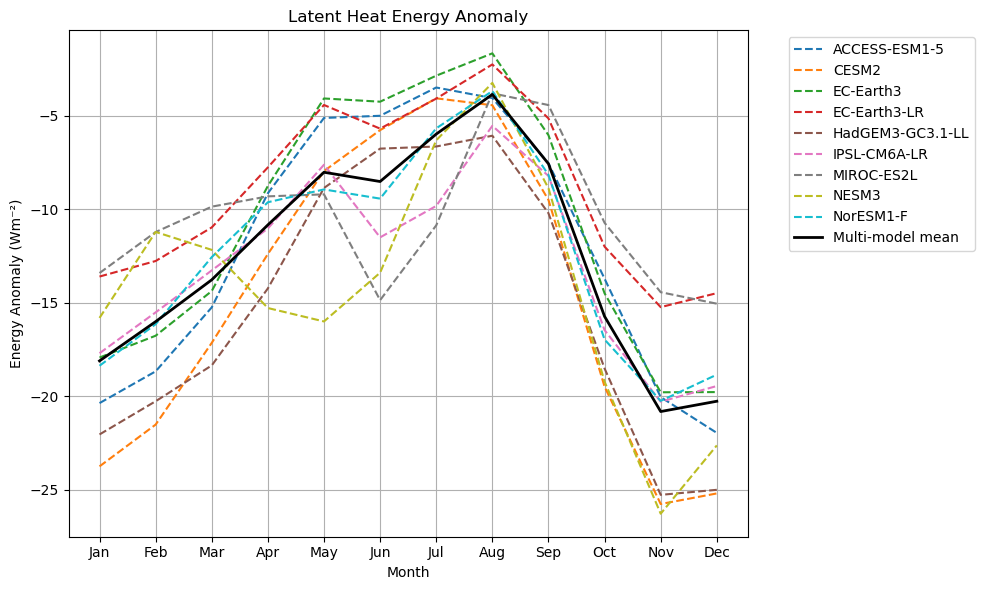

In [21]:
hfss_energy_mmm = plot_multi_model_mean(experiment_energy_dict, 'hfss', title='Latent Heat Energy Anomaly', ylabel = 'Energy Anomaly (Wm⁻²)')

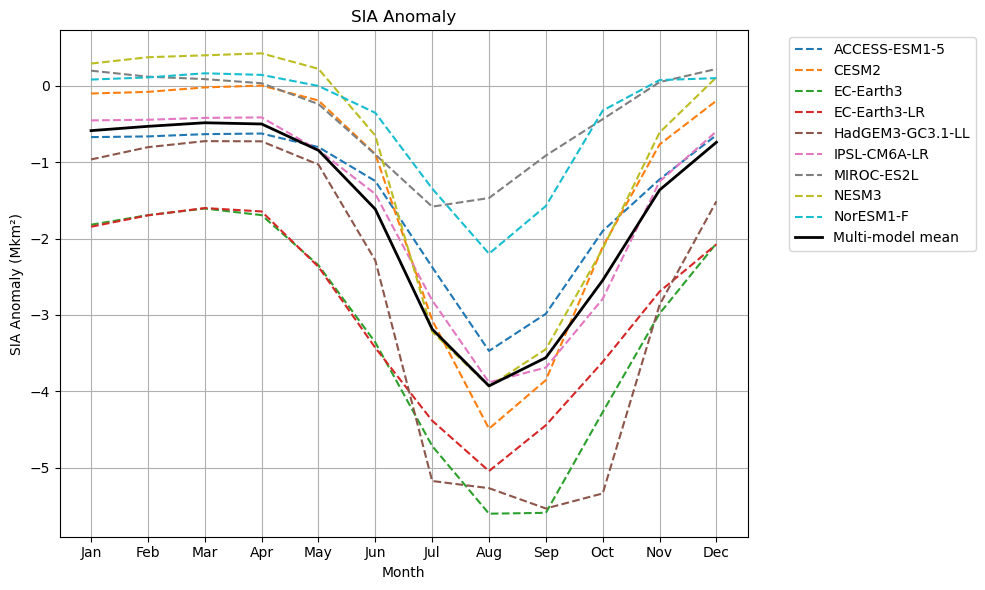

In [22]:
sia_anomaly_mmm = plot_multi_model_mean(anomaly_si_dict, 'siconc', title='SIA Anomaly', ylabel = 'SIA Anomaly (Mkm²)')

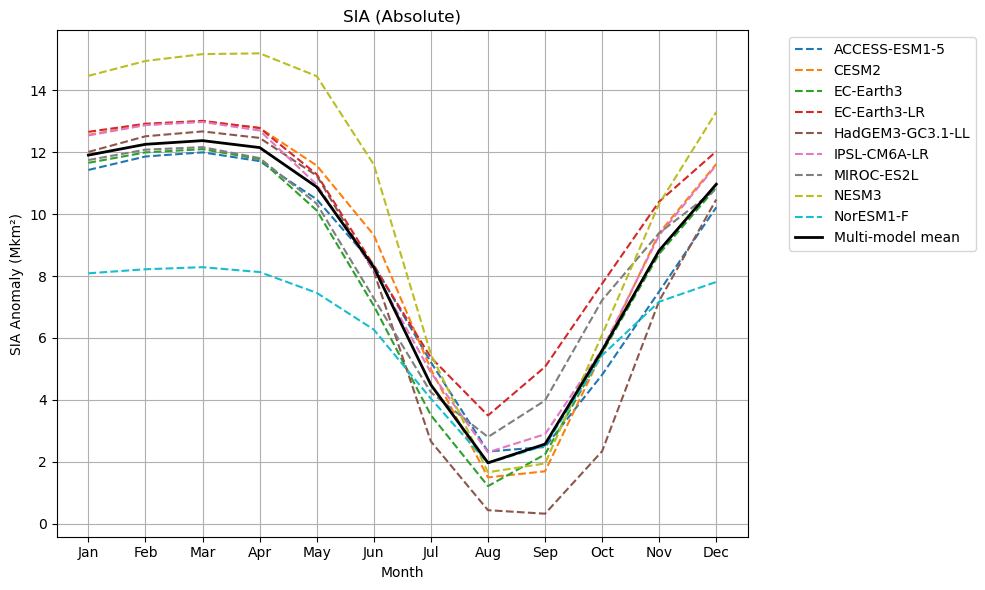

In [23]:
sia_absolute_mmm = plot_multi_model_mean(experiment_si_dict, 'siconc', title='SIA (Absolute)', ylabel = 'SIA Anomaly (Mkm²)')

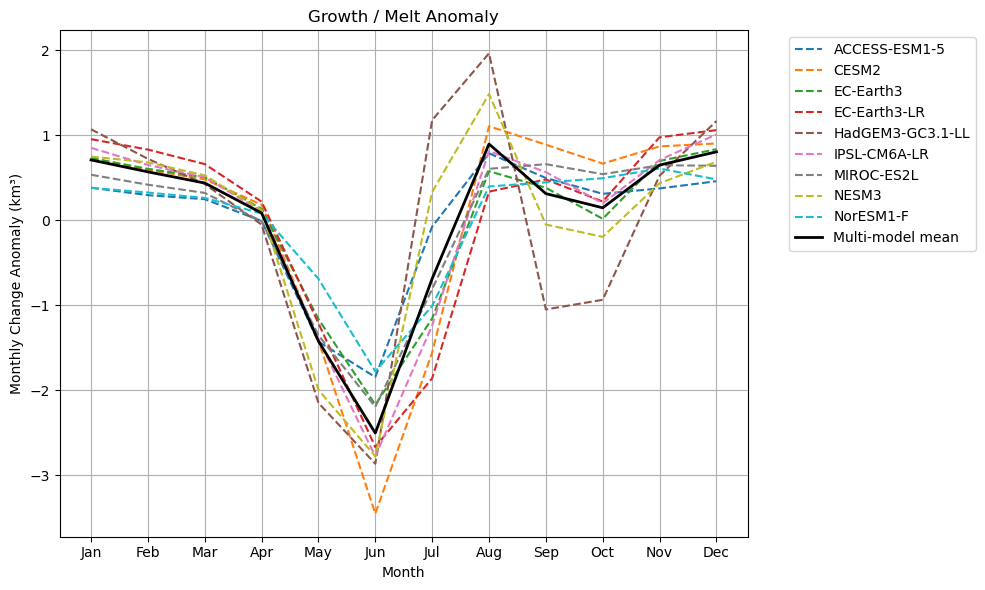

In [24]:
growth_anomaly_mmm = plot_multi_model_mean(anomaly_growth_dict, 'growth', title='Growth / Melt Anomaly', 
                    ylabel = 'Monthly Change Anomaly (km³)',
                    save_name = 'mmm_growth_anomaly')

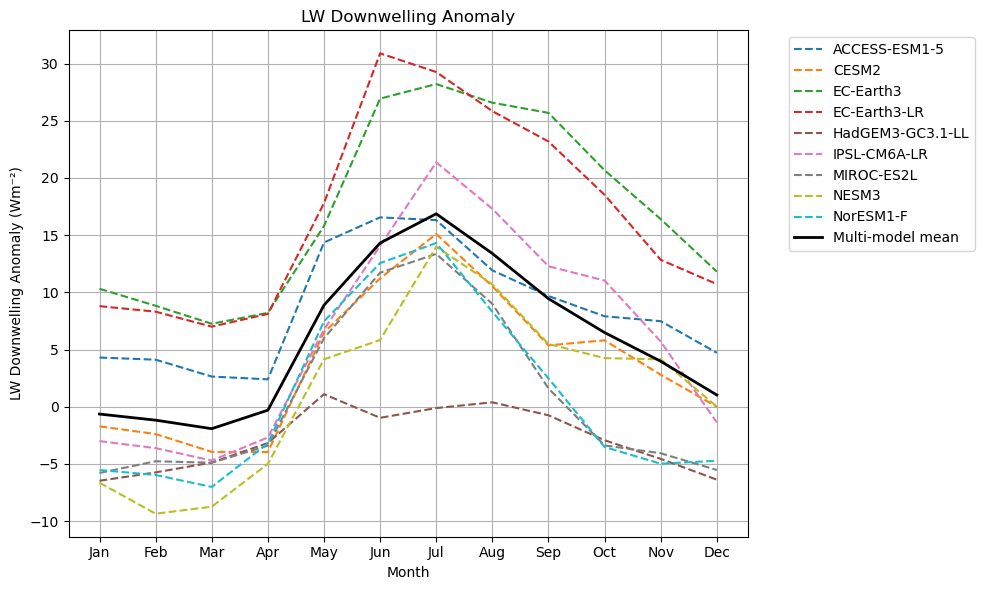

In [25]:
rlds_mmm = plot_multi_model_mean(anomaly_energy_dict, 'rlds', title='LW Downwelling Anomaly', ylabel = 'LW Downwelling Anomaly (Wm⁻²)')#, save_name = 'rsus_mmm')

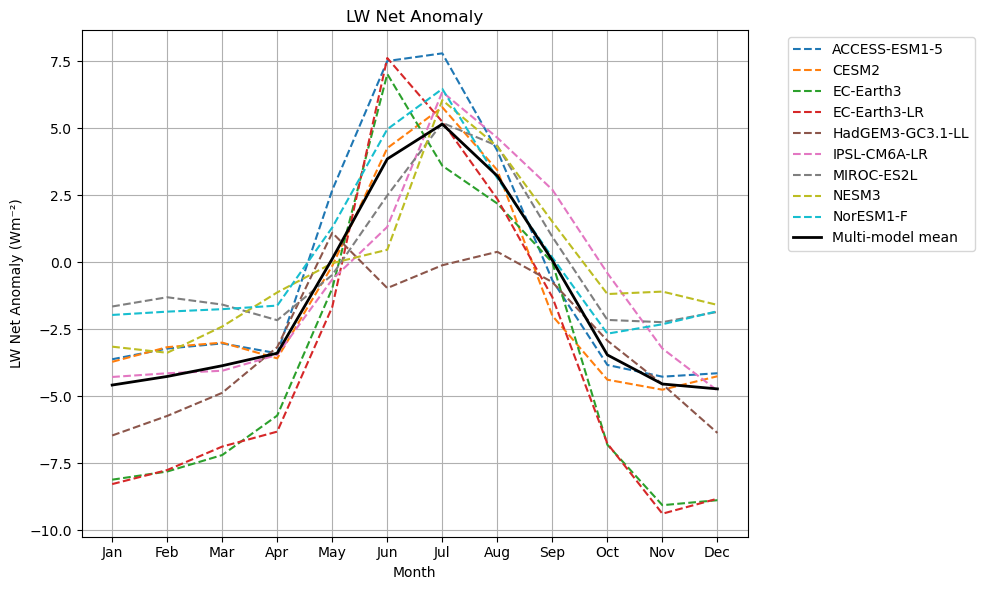

In [26]:
rlds_mmm = plot_multi_model_mean(anomaly_energy_dict_2, 'lw_total', title='LW Net Anomaly', ylabel = 'LW Net Anomaly (Wm⁻²)')#, save_name = 'rsus_mmm')

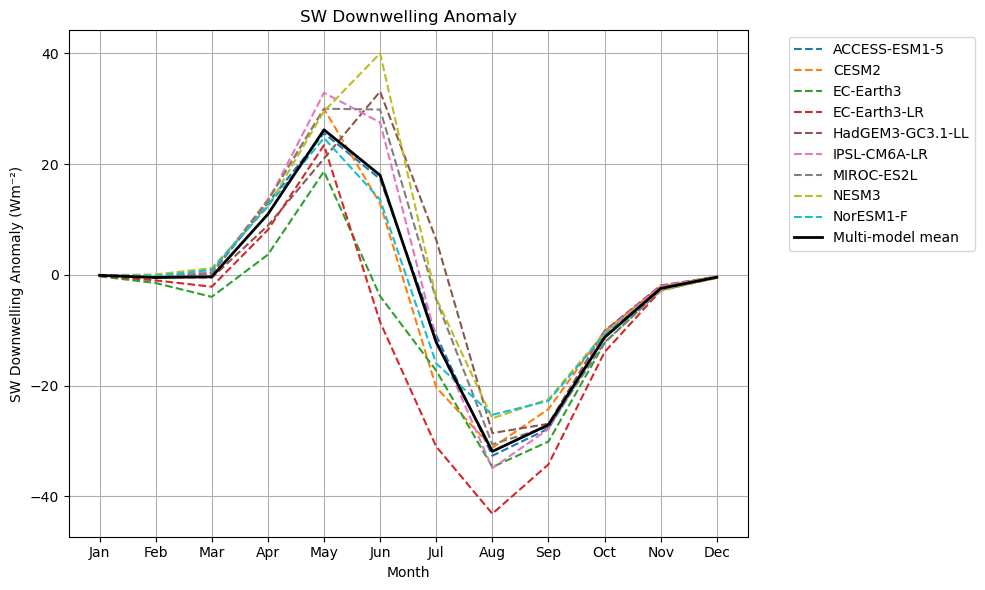

In [27]:
rsds_mmm = plot_multi_model_mean(anomaly_energy_dict, 'rsds', title='SW Downwelling Anomaly', ylabel = 'SW Downwelling Anomaly (Wm⁻²)', save_name = 'rsds_mmm')

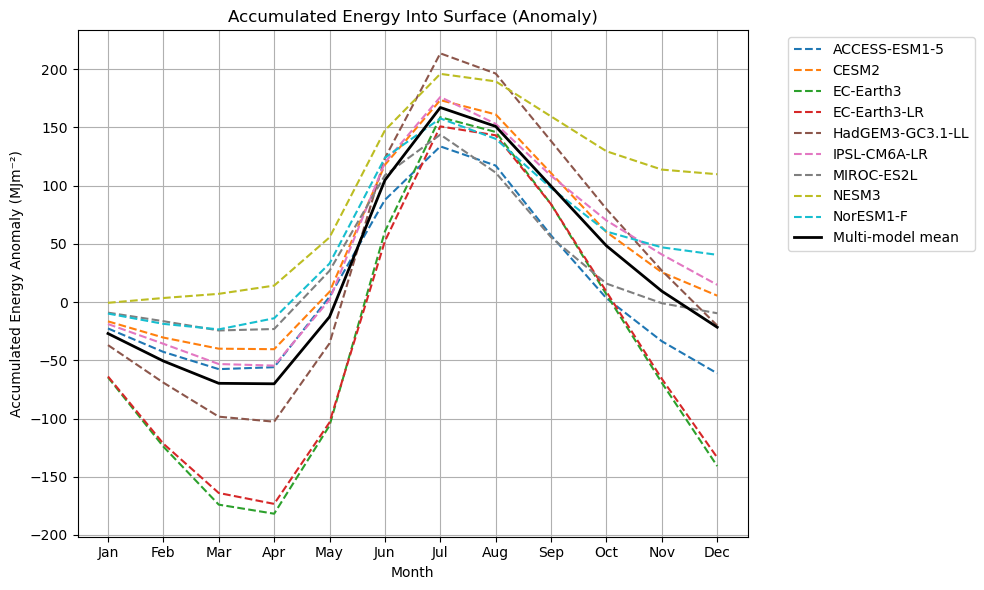

In [28]:
#create a plot of cumulative energy in to the surface. 
for model, variables in anomaly_energy_dict.items():
    variables['total_cumulative'] = np.cumsum(variables['total']) * t_seconds / 1e6  #Convert to MJ per m2

total_cumulative_mmm = plot_multi_model_mean(anomaly_energy_dict, 'total_cumulative', 
                                             title='Accumulated Energy Into Surface (Anomaly)', 
                                             ylabel = 'Accumulated Energy Anomaly (MJm⁻²)',
                                            save_name = 'accumulated_energy_anomaly')

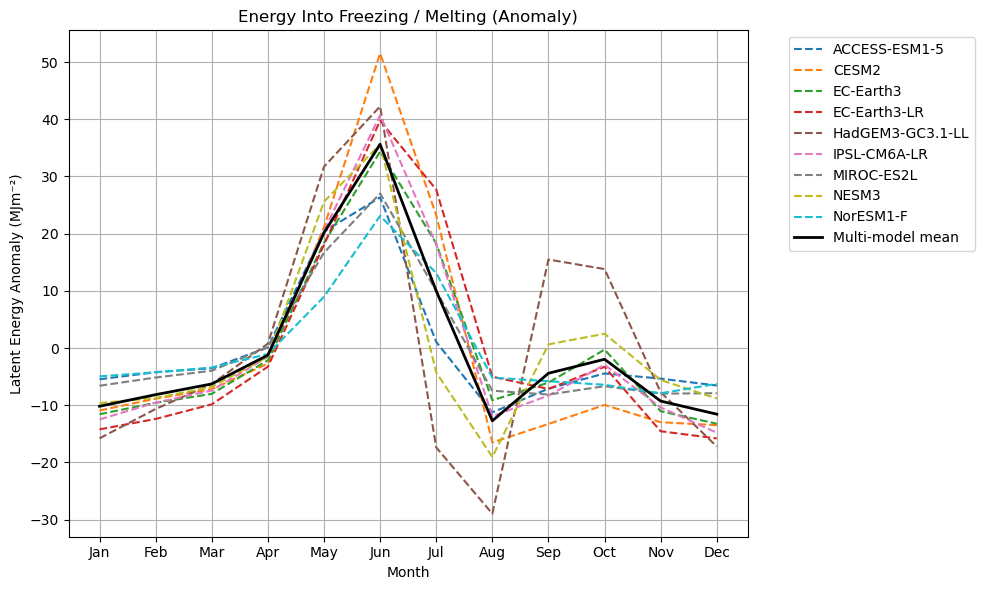

In [29]:

for model, variables in anomaly_energy_dict.items():
    variables['melt_energy'] = -1.0* si_latent_volume * anomaly_growth_dict[model]['growth'] * 1e12 / model_area_dict[model][area_var]

melt_energy_mmm = plot_multi_model_mean(anomaly_energy_dict, 'melt_energy', title='Energy Into Freezing / Melting (Anomaly)', ylabel = 'Latent Energy Anomaly (MJm⁻²)')

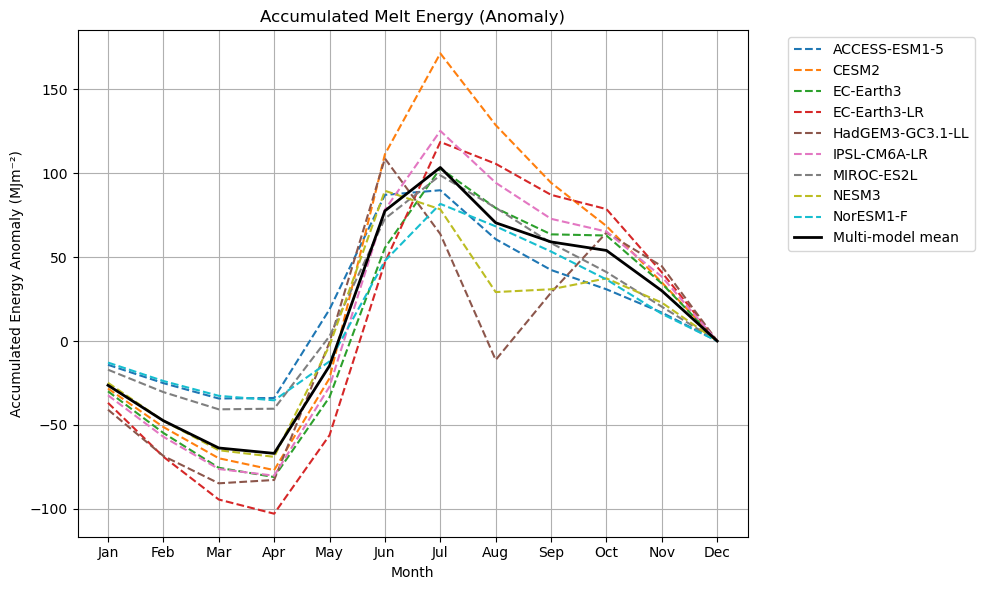

In [30]:
for model, variables in anomaly_energy_dict.items():
    variables['melt_energy_cumulative'] = np.cumsum(variables['melt_energy']) * t_seconds / 1e6  #Convert to MJ per m2

melt_cumulative_mmm = plot_multi_model_mean(anomaly_energy_dict, 'melt_energy_cumulative', title='Accumulated Melt Energy (Anomaly)', ylabel = 'Accumulated Energy Anomaly (MJm⁻²)')

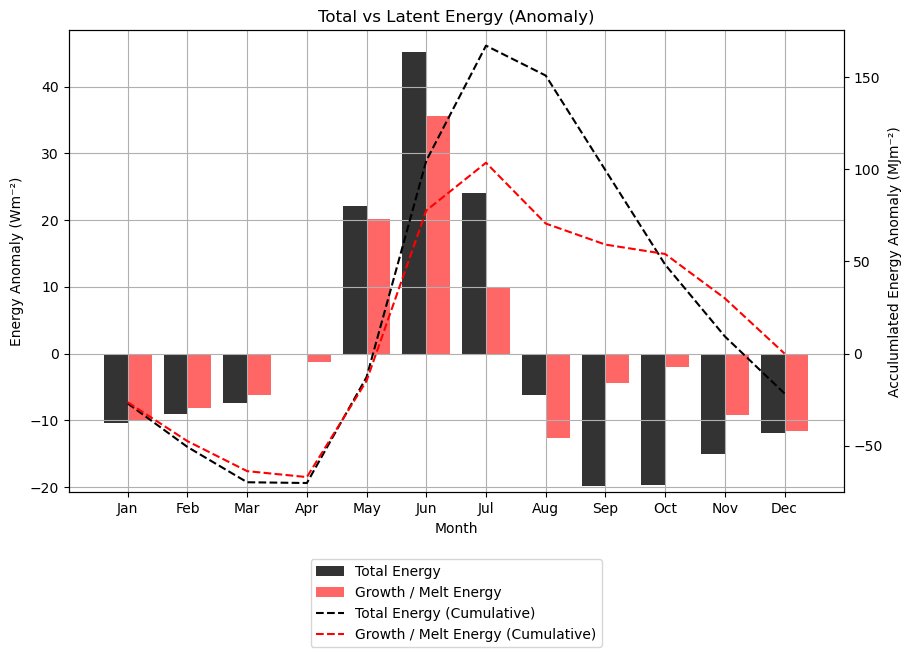

In [31]:
fig, ax1 = plt.subplots(figsize=(10, 6))

bar_width = 0.4 
t = np.arange(12)

ax1.grid(True)
ax1.bar(t - bar_width/2, total_energy_mmm, width=bar_width, label='Total Energy', color='black', alpha=0.8)
ax1.bar(t + bar_width/2, melt_energy_mmm, width=bar_width, label='Growth / Melt Energy', color='red', alpha=0.6)
ax1.set_ylabel('Energy Anomaly (Wm⁻²)')
ax1.set_xlabel('Month')
ax1.set_xticks(t)
ax1.set_xticklabels(months)


ax2 = ax1.twinx()
ax2.plot(total_cumulative_mmm, label='Total Energy (Cumulative)', color='black', linestyle = '--')
ax2.plot(melt_cumulative_mmm, label='Growth / Melt Energy (Cumulative)', color='red', linestyle = '--')

ax2.set_ylabel('Acculumlated Energy Anomaly (MJm⁻²)')

# Title and legend (combine all handles)
lines, labels = [], []
for ax in [ax1, ax2]:
    l, lab = ax.get_legend_handles_labels()
    lines += l
    labels += lab
ax1.legend(lines, labels, bbox_to_anchor=(0.5, -0.35), loc='lower center')

# Get the 0 line on both axes to line up. Surprsingly involved
#####
# Compute range above and below zero for each axis
neg1 = abs(min(total_energy_mmm.min(), 0))
pos1 = max(total_energy_mmm.max(), 0)

neg2 = abs(min(total_cumulative_mmm.min(), 0))
pos2 = max(total_cumulative_mmm.max(), 0)

# Choose a shared ratio
r1 = neg1 / pos1 if pos1 != 0 else 1
r2 = neg2 / pos2 if pos2 != 0 else 1

# Average the ratios to align 0 on both axes
avg_ratio = (r1 + r2) / 2

# Use avg_ratio to set both axis limits symmetrically
y1_max = max(total_energy_mmm.max(), neg1 / avg_ratio) * 1.05
y1_min = -avg_ratio * y1_max
ax1.set_ylim(y1_min, y1_max)

y2_max = max(total_cumulative_mmm.max(), neg2 / avg_ratio) *1.05
y2_min = -avg_ratio * y2_max
ax2.set_ylim(y2_min, y2_max)
#####

plt.title("Total vs Latent Energy (Anomaly)")
plt.savefig('/home/users/matt/plots/' + 'mmm_barchart_tot_vs_melt_energy' + '.png',
            bbox_inches='tight')
plt.show()

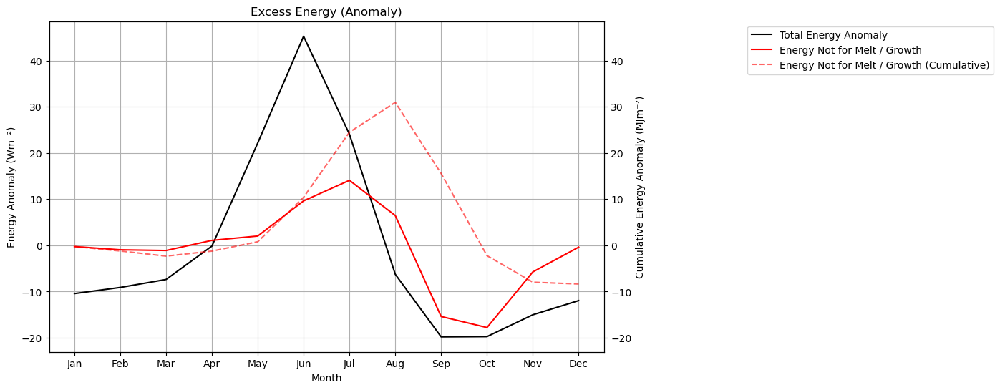

In [32]:
not_melt_mmm = total_energy_mmm - melt_energy_mmm
not_melt_cumulative_mmm = np.cumsum(not_melt_mmm)
fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(total_energy_mmm, label='Total Energy Anomaly', color='black')
ax1.plot(not_melt_mmm, label='Energy Not for Melt / Growth', color='red')
ax1.set_ylabel('Energy Anomaly (Wm⁻²)')
ax1.set_xlabel('Month')
ax1.set_xticks(np.arange(12))
ax1.set_xticklabels(months)
ax1.grid(True)

ax2 = ax1.twinx()
#ax2.plot(total_cumulative_mmm, label='Total Energy (Cumulative)', color='black', linestyle = '--', alpha = 0.6)
ax2.plot(not_melt_cumulative_mmm, label='Energy Not for Melt / Growth (Cumulative)', color='red', linestyle = '--', alpha = 0.6)
ax2.set_ylabel('Cumulative Energy Anomaly (MJm⁻²)')
ax2.grid(False)

ymin, ymax = ax1.get_ylim()
ax2.set_ylim(ymin, ymax)
plt.title("Excess Energy (Anomaly)")

lines, labels = [], []
for ax in [ax1, ax2]:
    l, lab = ax.get_legend_handles_labels()
    lines += l
    labels += lab
ax1.legend(lines, labels, bbox_to_anchor=(1.25, 1), loc='upper left')
plt.savefig('/home/users/matt/plots/' + 'mmm_totenergy_melt_energy' + '.png',
            bbox_inches='tight')
plt.show()

#Positive means there is radiative energy that is NOT going into melt
#Negative means there is energy going in to melt from elsewhere (i.e. ocean) 

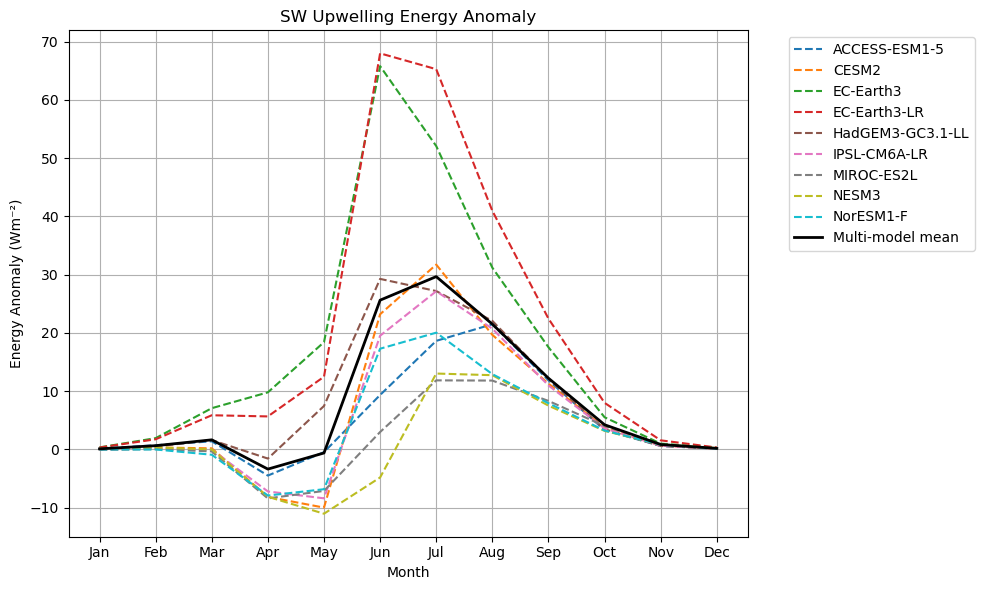

In [33]:
rsus_mmm = plot_multi_model_mean(anomaly_energy_dict, 'rsus', title='SW Upwelling Energy Anomaly', ylabel = 'Energy Anomaly (Wm⁻²)')

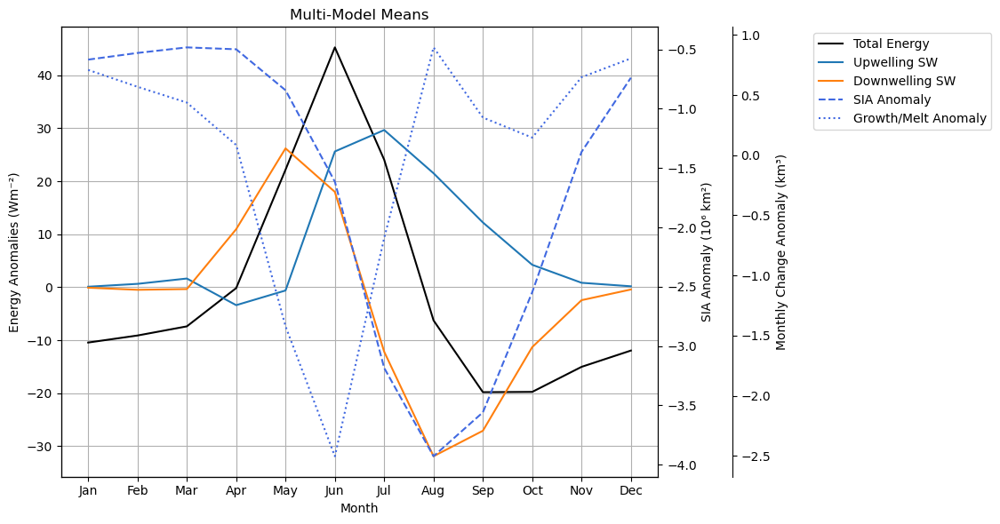

In [34]:
# Create base figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Primary axis (left): total, rsus, rsds
ax1.plot(total_energy_mmm, label='Total Energy', color='black')
ax1.plot(rsus_mmm, label='Upwelling SW',color='#1f77b4')
ax1.plot(rsds_mmm, label='Downwelling SW',color='#ff7f0e')
ax1.set_ylabel('Energy Anomalies (Wm⁻²)')
ax1.set_xlabel('Month')
ax1.set_xticks(t)
ax1.set_xticklabels(months)
ax1.grid(True)

# Secondary axis (right): sia_anomaly_mmm
ax2 = ax1.twinx()
ax2.plot(sia_anomaly_mmm, label='SIA Anomaly', linestyle='--', color='#4169E1')
ax2.set_ylabel('SIA Anomaly (10⁶ km²)')

# Third axis (right, offset): sia_absolute_mmm
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))  # Offset third y-axis
ax3.plot(growth_anomaly_mmm, label='Growth/Melt Anomaly', linestyle=':', color='#4169E1')
ax3.set_ylabel('Monthly Change Anomaly (km³)')

# Title and legend (combine all handles)
lines, labels = [], []
for ax in [ax1, ax2, ax3]:
    l, lab = ax.get_legend_handles_labels()
    lines += l
    labels += lab
ax1.legend(lines, labels, bbox_to_anchor=(1.25, 1), loc='upper left')

plt.title("Multi-Model Means")
fig.tight_layout()
plt.savefig('/home/users/matt/plots/' + 'mmm_totenergy_sia_growth_anomaly' + '.png',
            bbox_inches='tight')
plt.show()


In [35]:
sia_anomaly_mmm

array([-0.58567761, -0.52942303, -0.48255377, -0.49854444, -0.84386226,
       -1.61445582, -3.18515827, -3.92887199, -3.55886154, -2.54586995,
       -1.36342574, -0.73820053])

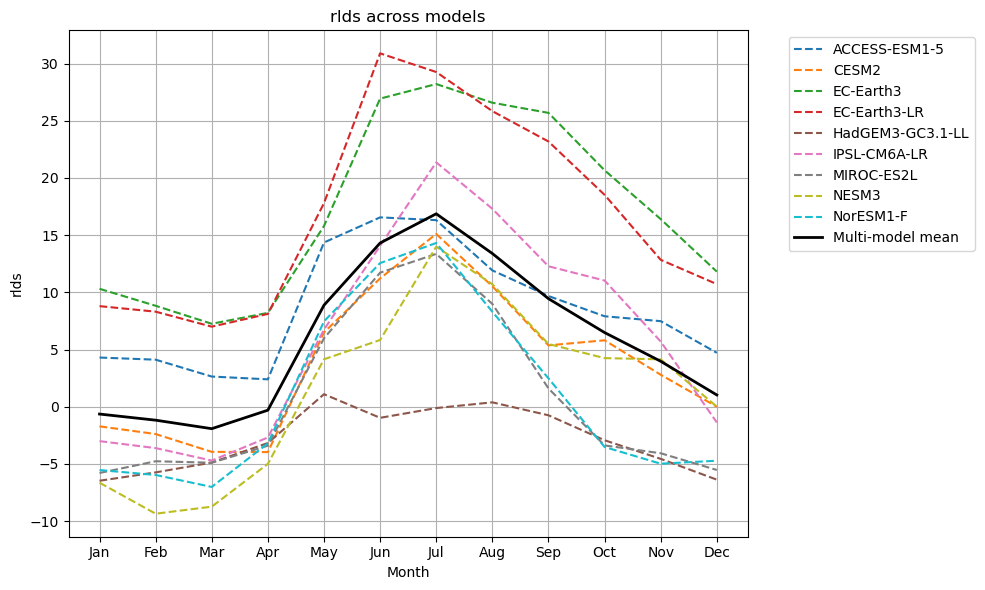

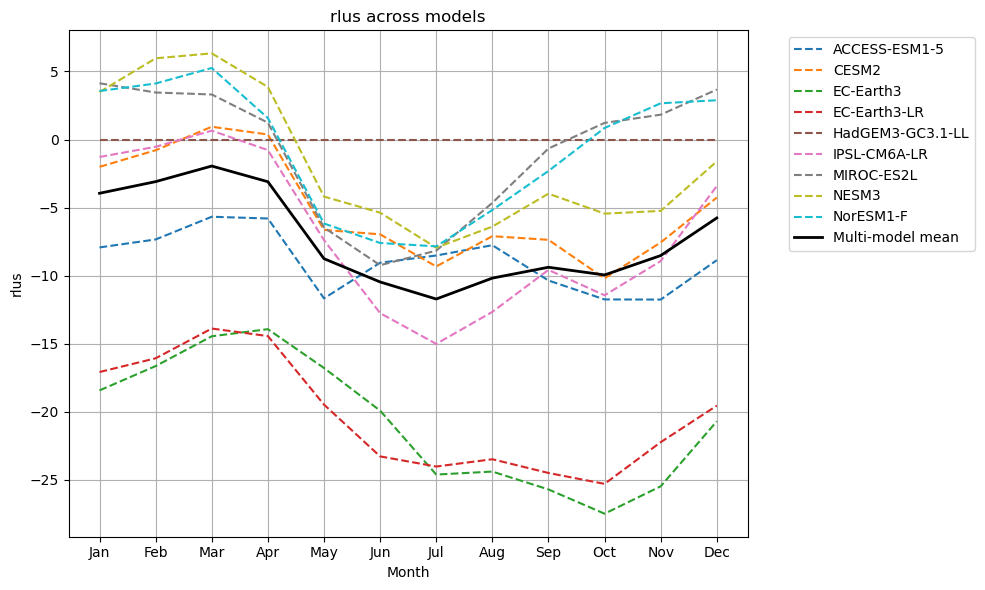

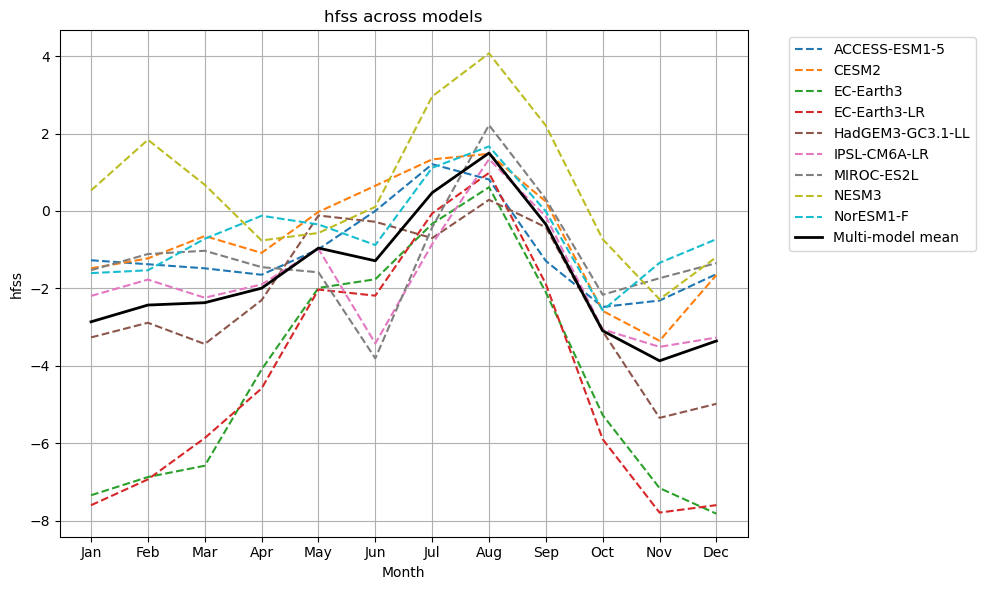

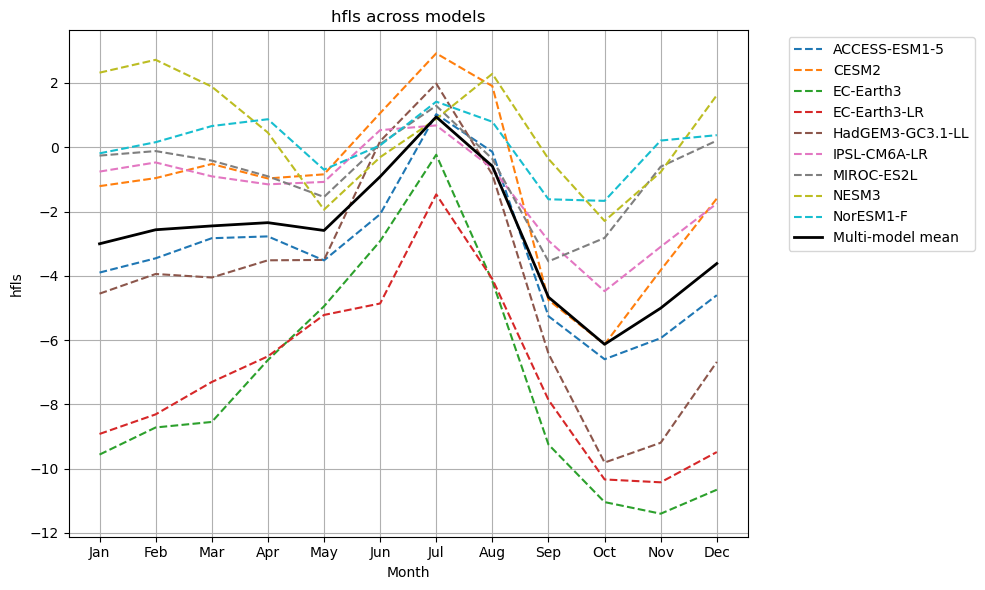

In [36]:
rlds_mmm = plot_multi_model_mean(anomaly_energy_dict, 'rlds')
rlus_mmm = plot_multi_model_mean(anomaly_energy_dict, 'rlus')
hfss_mmm = plot_multi_model_mean(anomaly_energy_dict, 'hfss')
hfls_mmm = plot_multi_model_mean(anomaly_energy_dict, 'hfls')
sw_mmm = rsus_mmm + rsds_mmm
lw_mmm = rlus_mmm + rlds_mmm

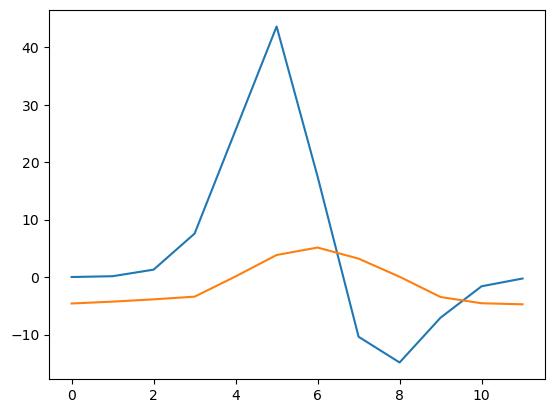

In [37]:
plt.plot(sw_mmm)
plt.plot(lw_mmm)

In [38]:
# Colors for stacked components
energy_colors = {
    'rsus': '#1f77b4', 'rsds': '#ff7f0e', 'rlds': '#2ca02c',
    'rlus': '#d62728', 'hfss': '#9467bd', 'hfls': '#8c564b', 'turb':'#7d7979'
}

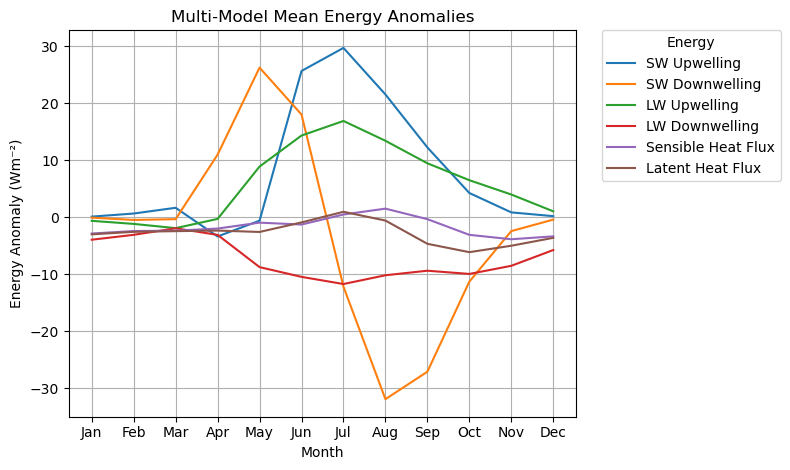

In [39]:
plt.plot(t, rsus_mmm, label='SW Upwelling', color=energy_colors['rsus'])
plt.plot(t, rsds_mmm, label='SW Downwelling', color=energy_colors['rsds'])
plt.plot(t, rlds_mmm, label='LW Upwelling', color=energy_colors['rlds'])
plt.plot(t, rlus_mmm, label='LW Downwelling', color=energy_colors['rlus'])
plt.plot(t, hfss_mmm, label='Sensible Heat Flux', color=energy_colors['hfss'])
plt.plot(t, hfls_mmm, label='Latent Heat Flux', color=energy_colors['hfls'])

plt.xticks(t,months)
plt.xlabel('Month')
plt.ylabel('Energy Anomaly (Wm⁻²)')
plt.grid(True)
plt.title('Multi-Model Mean Energy Anomalies')
# Legend outside the plot
plt.legend(title="Energy",
           bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

# Adjust layout to make room for legend
plt.tight_layout(rect=[0, 0, 1.25, 1])


plt.savefig('/home/users/matt/plots/' + 'mmm_radiative_energy_anomalies' + '.png',
            bbox_inches='tight')
plt.show()

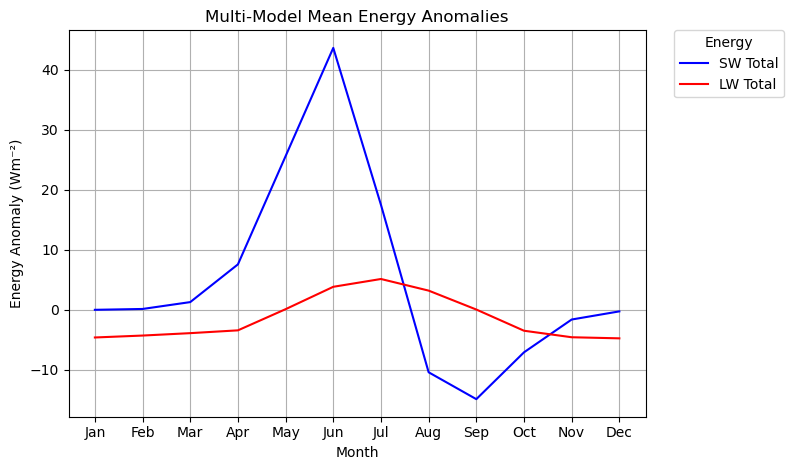

In [40]:
plt.plot(t, sw_mmm, label='SW Total', color='blue')
plt.plot(t, lw_mmm, label='LW Total', color='red')

plt.xticks(t,months)
plt.xlabel('Month')
plt.ylabel('Energy Anomaly (Wm⁻²)')
plt.grid(True)
plt.title('Multi-Model Mean Energy Anomalies')
# Legend outside the plot
plt.legend(title="Energy",
           bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)#


# Adjust layout to make room for legend
plt.tight_layout(rect=[0, 0, 1.25, 1])


plt.savefig('/home/users/matt/plots/' + 'mmm_total_swlw_anomalies' + '.png',
            bbox_inches='tight')
plt.show()

In [41]:
total_energy_mmm

array([-10.43621518,  -9.10639924,  -7.38192064,  -0.15925819,
        22.17779494,  45.27178012,  24.06165776,  -6.25930973,
       -19.80283585, -19.74904949, -15.02175058, -11.94942501])

In [42]:
sw_mmm

array([ 1.76197108e-02,  1.58558963e-01,  1.30167729e+00,  7.58232377e+00,
        2.56012557e+01,  4.36245249e+01,  1.74959543e+01, -1.03820305e+01,
       -1.48574037e+01, -7.05952648e+00, -1.59745843e+00, -2.43024580e-01])

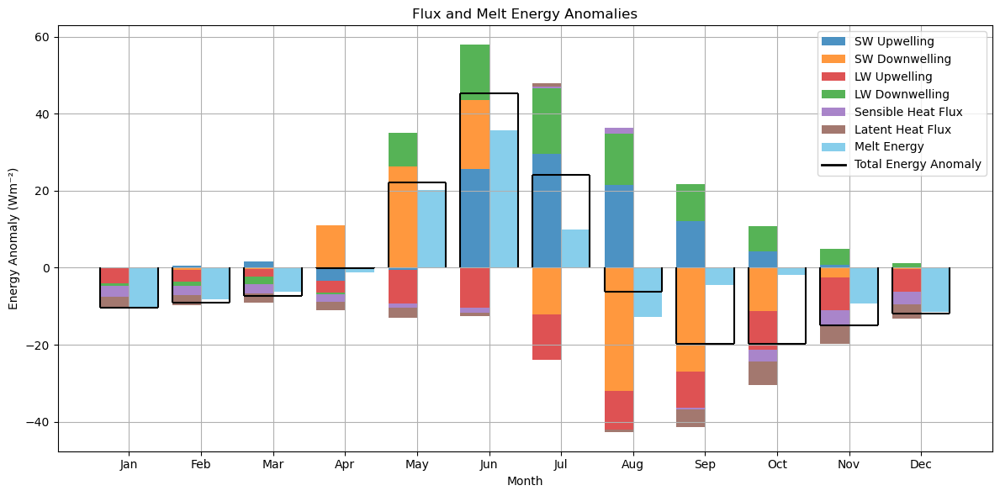

In [43]:
width = 0.4  # bar width

# Shifted positions
t_stacked = t - 0.5 * width  # stacked bars to the left
t_total   = t          # total_energy in center
t_melt    = t + 0.5 * width  # melt_energy to the right


# Start fresh figure
fig, ax = plt.subplots(figsize=(12, 6))
plt.grid(True)



# Reset stacking bases
bottom_pos = np.zeros_like(rsus_mmm)
bottom_neg = np.zeros_like(rsus_mmm)

# Helper to stack positive/negative bars
def bar_stack(t_pos, values, label, color):
    global bottom_pos, bottom_neg
    values = np.array(values)
    pos = np.where(values >= 0, values, 0)
    neg = np.where(values < 0, values, 0)
    
    ax.bar(t_pos, pos, bottom=bottom_pos, width=width, label=label, color=color, alpha =0.8)
    ax.bar(t_pos, neg, bottom=bottom_neg, width=width, color=color, alpha =0.8)
    
    bottom_pos += pos
    bottom_neg += neg

# Plot stacked bars (shifted left)
bar_stack(t_stacked, rsus_mmm, 'SW Upwelling', energy_colors['rsus'])
bar_stack(t_stacked, rsds_mmm, 'SW Downwelling', energy_colors['rsds'])
bar_stack(t_stacked, rlus_mmm, 'LW Upwelling', energy_colors['rlus'])
bar_stack(t_stacked, rlds_mmm, 'LW Downwelling', energy_colors['rlds'])
bar_stack(t_stacked, hfss_mmm, 'Sensible Heat Flux', energy_colors['hfss'])
bar_stack(t_stacked, hfls_mmm, 'Latent Heat Flux', energy_colors['hfls'])

# Plot standalone bars (centered and right)
#ax.bar(t_total, total_energy_mmm, width=width, color='black', label='Net Energy Anomaly')
#ax.bar(t_sw, sw_mmm, width=width, color='pink', label='Total SW Energy')
ax.bar(t_melt, melt_energy_mmm, width=width, color='skyblue', label='Melt Energy')

#ax.scatter(t_total, total_energy_mmm, linestyle = '-', color='black', label='Net Energy Anomaly')

for x_val, y_val in zip(t, total_energy_mmm):
    plt.hlines(y=y_val, xmin=x_val - width, xmax=x_val + width, color='black')

for x_val, y_val in zip(t - width, total_energy_mmm):
    plt.vlines(x=x_val, ymin=0, ymax=y_val, color='black')

for x_val, y_val in zip(t + width, total_energy_mmm):
    plt.vlines(x=x_val, ymin=0, ymax=y_val, color='black')

# Labels and formatting
ax.set_xlabel('Month')
ax.set_ylabel('Energy Anomaly (Wm⁻²)')
ax.set_title('Flux and Melt Energy Anomalies')
ax.set_xticks(t)
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Auto-scale y-limits with padding
all_values = np.concatenate([bottom_pos, bottom_neg, total_energy_mmm, melt_energy_mmm])
ymin = all_values.min() - 5
ymax = all_values.max() + 5
ax.set_ylim(ymin, ymax)

# Create a proxy artist for the horizontal lines
hl_proxy = mlines.Line2D([], [], color='black', linewidth=2, label='Total Energy Anomaly')

# Add it to the legend
ax.legend(handles=ax.get_legend_handles_labels()[0] + [hl_proxy])
plt.tight_layout()

plt.savefig('/home/users/matt/plots/' + 'barchart_stacked_energy_melt' + '.png',
            bbox_inches='tight')

plt.show()


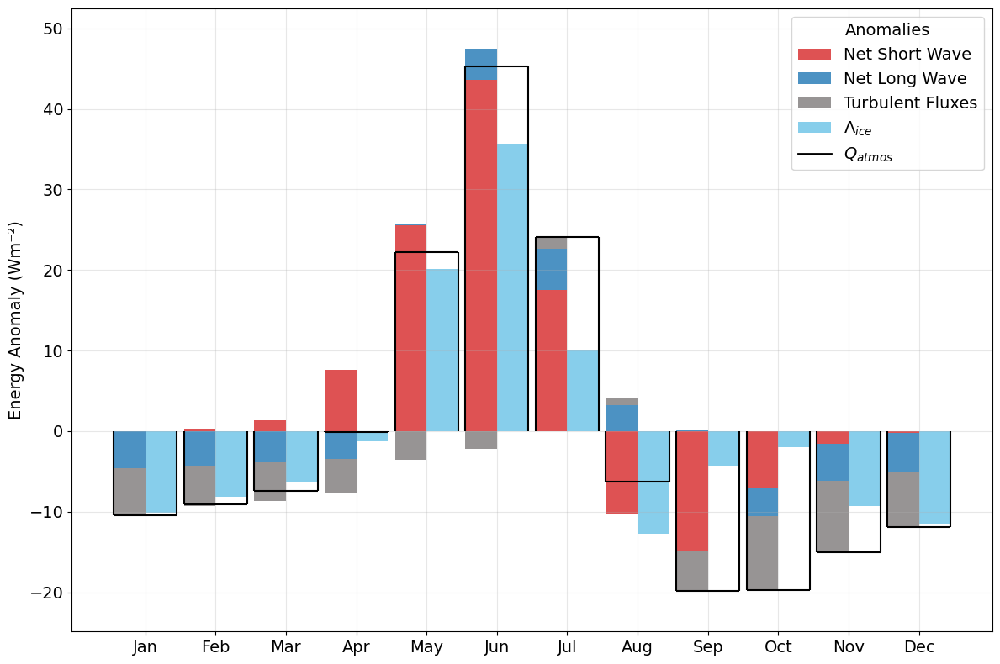

In [83]:
# Colors for stacked components
energy_colors = {
    'rsus': '#1f77b4', 'rsds': '#ff7f0e', 'rlds': '#2ca02c',
    'rlus': '#d62728', 'hfss': '#9467bd', 'hfls': '#8c564b', 'turb':'#7d7979'
}

width = 0.45  # bar width

# Shifted positions
t_stacked = t - 0.5 * width  # stacked bars to the left
t_total   = t          # total_energy in center
t_melt    = t + 0.5 * width  # melt_energy to the right

turb_mmm = hfss_mmm + hfls_mmm


# Start fresh figure
fig, ax = plt.subplots(figsize=(12, 8))
#plt.grid(True)



# Reset stacking bases
bottom_pos = np.zeros_like(rsus_mmm)
bottom_neg = np.zeros_like(rsus_mmm)

# Helper to stack positive/negative bars
def bar_stack(t_pos, values, label, color):
    global bottom_pos, bottom_neg
    values = np.array(values)
    pos = np.where(values >= 0, values, 0)
    neg = np.where(values < 0, values, 0)
    
    ax.bar(t_pos, pos, bottom=bottom_pos, width=width, label=label, color=color, alpha =0.8)
    ax.bar(t_pos, neg, bottom=bottom_neg, width=width, color=color, alpha =0.8)
    
    bottom_pos += pos
    bottom_neg += neg

# Plot stacked bars (shifted left)
bar_stack(t_stacked, sw_mmm, 'Net Short Wave', energy_colors['rlus'])
bar_stack(t_stacked, lw_mmm, 'Net Long Wave', energy_colors['rsus'])
bar_stack(t_stacked, turb_mmm, 'Turbulent Fluxes', energy_colors['turb'])

# Plot standalone bars (centered and right)
#ax.bar(t_total, total_energy_mmm, width=width, color='black', label='Net Energy Anomaly')
#ax.bar(t_sw, sw_mmm, width=width, color='pink', label='Total SW Energy')
ax.bar(t_melt, melt_energy_mmm, width=width, color='skyblue', label=r"$\Lambda_{\mathit{ice}}$")

#ax.scatter(t_total, total_energy_mmm, linestyle = '-', color='black', label='Net Energy Anomaly')

for x_val, y_val in zip(t, total_energy_mmm):
    plt.hlines(y=y_val, xmin=x_val - width, xmax=x_val + width, color='black', linewidth=1.5)

for x_val, y_val in zip(t - width, total_energy_mmm):
    plt.vlines(x=x_val, ymin=0, ymax=y_val, color='black', linewidth=1.5)

for x_val, y_val in zip(t + width, total_energy_mmm):
    plt.vlines(x=x_val, ymin=0, ymax=y_val, color='black', linewidth=1.5)

# Labels and formatting
#ax.set_xlabel('Month', fontsize=14)
ax.set_ylabel('Energy Anomaly (Wm⁻²)', fontsize=14)
#ax.set_title('Flux and Latent Heat Anomalies', fontsize=16)
ax.set_xticks(t)
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], fontsize=14)
ax.tick_params(axis='y', labelsize=14)

# Auto-scale y-limits with padding
all_values = np.concatenate([bottom_pos, bottom_neg, total_energy_mmm, melt_energy_mmm])
ymin = all_values.min() - 5
ymax = all_values.max() + 5
ax.set_ylim(ymin, ymax)

ax.grid(alpha=0.3)

# Create a proxy artist for the horizontal lines
hl_proxy = mlines.Line2D([], [], color='black', linewidth=2, label=r"$Q_{\mathit{atmos}}$")

# Add it to the legend
ax.legend(handles=ax.get_legend_handles_labels()[0] + [hl_proxy], fontsize=14, title='Anomalies', title_fontsize=14)
plt.tight_layout()

plt.savefig('/home/users/matt/plots/' + 'barchart_stacked_energy_melt' + '.png',
            bbox_inches='tight')

plt.show()

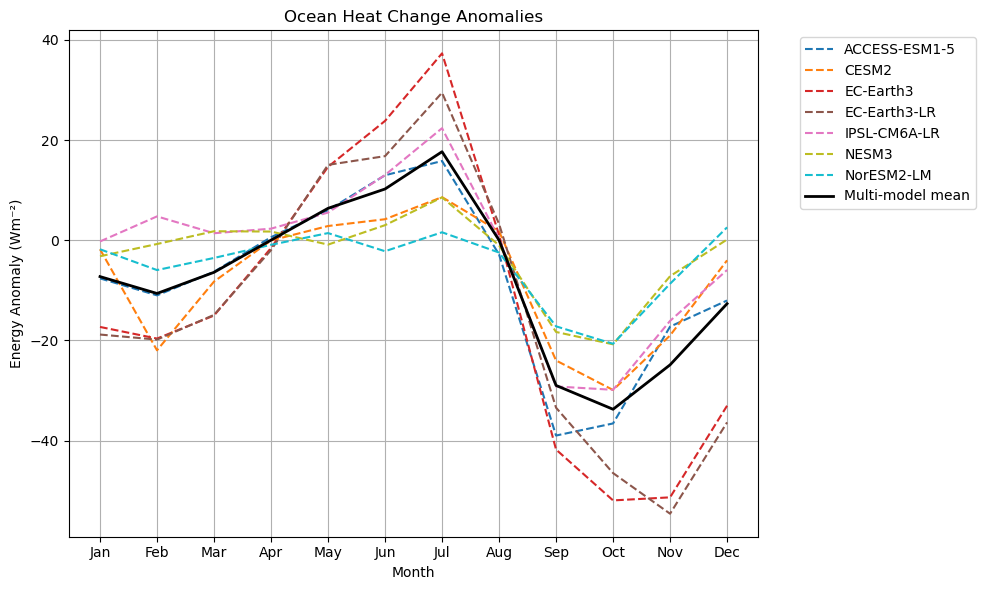

In [45]:
ocean_heat_changes_mmm = plot_multi_model_mean(anomaly_ocean_dict, 'heat_changes', title='Ocean Heat Change Anomalies', ylabel = 'Energy Anomaly (Wm⁻²)', save_name = 'ocean_heat_change')

In [46]:
anomaly_si_heat = np.array([-0.61593251, -0.52131246, -0.76832867, -0.71698103,  6.73301873,
        7.53884387, -1.80432005, -1.73887277,  2.11720687,  2.12075704,
        0.65294767, -0.36784261])

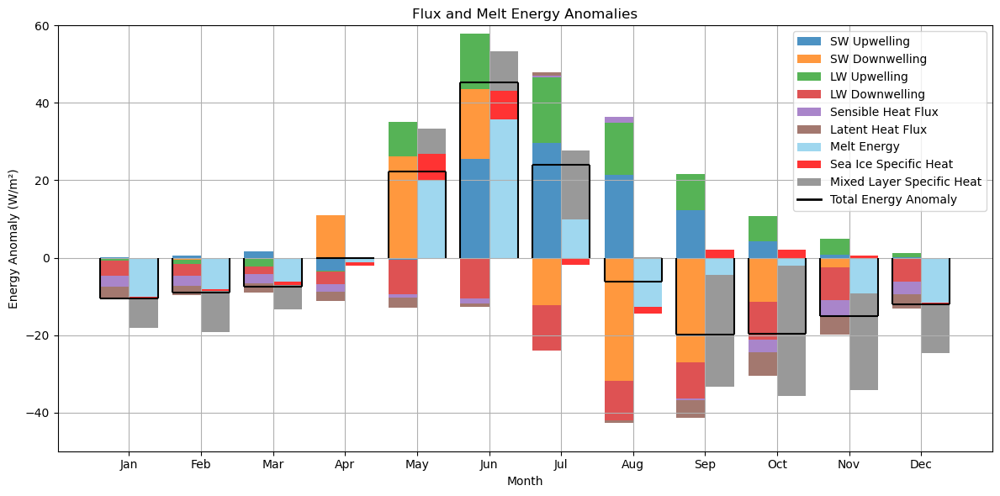

In [47]:

width = 0.4  # bar width

# Shifted positions
t_stacked = t - 0.5 * width  # stacked bars to the left
t_total   = t          # total_energy in center
t_melt    = t + 0.5 * width  # melt_energy to the right


# Start fresh figure
fig, ax = plt.subplots(figsize=(12, 6))
plt.grid(True)

# Colors for stacked components
energy_colors = {
    'rsus': '#1f77b4', 'rsds': '#ff7f0e', 'rlds': '#2ca02c',
    'rlus': '#d62728', 'hfss': '#9467bd', 'hfls': '#8c564b'
}

# Reset stacking bases
bottom_pos = np.zeros_like(rsus_mmm)
bottom_neg = np.zeros_like(rsus_mmm)

# Helper to stack positive/negative bars
def bar_stack(t_pos, values, label, color):
    global bottom_pos, bottom_neg
    values = np.array(values)
    pos = np.where(values >= 0, values, 0)
    neg = np.where(values < 0, values, 0)
    
    ax.bar(t_pos, pos, bottom=bottom_pos, width=width, label=label, color=color, alpha =0.8)
    ax.bar(t_pos, neg, bottom=bottom_neg, width=width, color=color, alpha =0.8)
    
    bottom_pos += pos
    bottom_neg += neg

# Plot stacked bars (shifted left)
bar_stack(t_stacked, rsus_mmm, 'SW Upwelling', energy_colors['rsus'])
bar_stack(t_stacked, rsds_mmm, 'SW Downwelling', energy_colors['rsds'])
bar_stack(t_stacked, rlds_mmm, 'LW Upwelling', energy_colors['rlds'])
bar_stack(t_stacked, rlus_mmm, 'LW Downwelling', energy_colors['rlus'])
bar_stack(t_stacked, hfss_mmm, 'Sensible Heat Flux', energy_colors['hfss'])
bar_stack(t_stacked, hfls_mmm, 'Latent Heat Flux', energy_colors['hfls'])

# Plot standalone bars (centered and right)
#ax.bar(t_total, total_energy_mmm, width=width, color='black', label='Net Energy Anomaly')
#ax.bar(t_sw, sw_mmm, width=width, color='pink', label='Total SW Energy')
bottom_pos = np.zeros_like(rsus_mmm)
bottom_neg = np.zeros_like(rsus_mmm)

bar_stack(t_melt, melt_energy_mmm, 'Melt Energy', 'skyblue')
bar_stack(t_melt, anomaly_si_heat, 'Sea Ice Specific Heat', 'red')
bar_stack(t_melt, ocean_heat_changes_mmm, 'Mixed Layer Specific Heat', 'gray')
#ax.scatter(t_total, total_energy_mmm, linestyle = '-', color='black', label='Net Energy Anomaly')

for x_val, y_val in zip(t, total_energy_mmm):
    plt.hlines(y=y_val, xmin=x_val - width, xmax=x_val + width, color='black')

for x_val, y_val in zip(t - width, total_energy_mmm):
    plt.vlines(x=x_val, ymin=0, ymax=y_val, color='black')

for x_val, y_val in zip(t + width, total_energy_mmm):
    plt.vlines(x=x_val, ymin=0, ymax=y_val, color='black')

# Labels and formatting
ax.set_xlabel('Month')
ax.set_ylabel('Energy Anomaly (W/m²)')
ax.set_title('Flux and Melt Energy Anomalies')
ax.set_xticks(t)
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Auto-scale y-limits with padding
all_values = np.concatenate([bottom_pos, bottom_neg, total_energy_mmm, melt_energy_mmm])
ymin = -50 #all_values.min() - 5
ymax = 60 #all_values.max() + 5
ax.set_ylim(ymin, ymax)

# Create a proxy artist for the horizontal lines
hl_proxy = mlines.Line2D([], [], color='black', linewidth=2, label='Total Energy Anomaly')

# Add it to the legend
ax.legend(handles=ax.get_legend_handles_labels()[0] + [hl_proxy])
plt.tight_layout()

plt.savefig('/home/users/matt/plots/' + 'barchart_stacked_energy_melt_specific' + '.png',
            bbox_inches='tight')

plt.show()

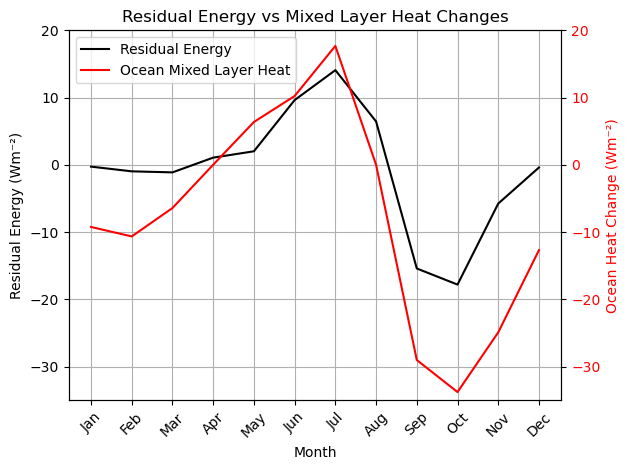

In [48]:
missing_energy_mmm = (total_energy_mmm - (melt_energy_mmm))
cumulative_missing_energy_mmm = np.cumsum(missing_energy_mmm)

ocean_heat_changes_mmm_hardcoded = np.array([-9.22719036e+00, -1.06293864e+01, -6.40416510e+00,  2.63371222e-02,
        6.37915937e+00,  1.02377394e+01,  1.76832121e+01,  1.89946578e-02,
       -2.90000780e+01, -3.37582611e+01, -2.48868873e+01, -1.26711382e+01])

fig, ax1 = plt.subplots()

# 1) Plot the “missing energy” on the left axis
ax1.plot(t, missing_energy_mmm,
         label='Residual Energy',
         color='black')
ax1.set_ylabel('Residual Energy (Wm⁻²)', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# 2) Make a twin axis for the ocean heat and plot it
ax2 = ax1.twinx()
ax2.plot(t, ocean_heat_changes_mmm_hardcoded,
         label='Ocean Mixed Layer Heat',
         color='red')
ax2.set_ylabel('Ocean Heat Change (Wm⁻²)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# # 3) Grab left‐axis limits and ticks
# y1_min, y1_max = ax1.get_ylim()
# left_ticks = ax1.get_yticks()

# # 4) Apply exactly twice that range to the right axis…
# scale = 2
# ax2.set_ylim(y1_min * scale, y1_max * scale)

# # …and put its ticks at left_ticks*scale so that,
# # e.g. left  10 → right 20, left –10 → right –20, etc.
# ax2.set_yticks(left_ticks * scale)

ax1.set_ylim(-35, 20)
ax2.set_ylim(-35, 20)

# common formatting
ax1.set_xlabel('Month')
ax1.set_xticks(t)
ax1.set_xticklabels(months, rotation=45)
ax1.grid(True)

# combined legend
h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
ax1.legend(h1 + h2, l1 + l2, loc='upper left')

plt.title('Residual Energy vs Mixed Layer Heat Changes')
fig.tight_layout()
plt.savefig('/home/users/matt/plots/line_missing_energy.png',
            bbox_inches='tight')
plt.show()

# plt.plot(t, missing_energy_mmm, label = 'Missing Energy', color='black')
# #plt.plot(t+0.5, cumulative_missing_energy_mmm, label = 'Cumulative', color='black', linestyle = '--')
# plt.plot(t,  ocean_heat_changes_mmm, label = 'Ocean Mixed Layer Heat', color='red')
# plt.grid(True)
# plt.xticks(t, months)
# plt.ylabel('Missing Energy (MJ/m²)')
# plt.xlabel('Month')
# plt.legend()
# plt.title('Missing Energy vs Mixed Layer Heat Changes')
# plt.savefig('/home/users/matt/plots/' + 'line_missing_energy' + '.png',
#             bbox_inches='tight')
# plt.show()


In [49]:
missing_energy_mmm

array([ -0.25822107,  -0.95582753,  -1.11025467,   1.08247263,
         2.02498352,   9.6370172 ,  14.0812638 ,   6.45808699,
       -15.39439942, -17.7871076 ,  -5.74664171,  -0.38630323])

In [50]:
var1 = missing_energy_mmm
var2 = ocean_heat_changes_mmm_hardcoded

In [51]:
def harmonic_breakdown(x, name="series"):
    x = np.asarray(x, dtype=float)
    N = len(x)
    assert N == 12, "This helper assumes 12 evenly spaced monthly points."
    
    # Demean to remove DC (mean) energy
    xd = x - np.mean(x)
    X = np.fft.rfft(xd)  # bins 0..6 for N=12
    
    # Total variance of the demeaned data
    total_var = np.var(xd, ddof=0)
    
    rows = []
    amplitudes = []
    
    # First pass: compute amplitudes for k=1..N//2
    for k in range(1, N//2 + 1):
        A = 2 * np.abs(X[k]) / N
        amplitudes.append(A)
    
    amp_sum = sum(amplitudes)
    
    # Second pass: compute full info
    for k in range(1, N//2 + 1):
        A = amplitudes[k-1]
        phase_rad = np.angle(X[k])
        phase_deg = np.degrees(phase_rad)
        
        # Variance contributed by harmonic k
        var_k = (A**2) / 2.0
        pct_var = 100.0 * (var_k / total_var) if total_var > 0 else np.nan
        
        period_months = N / k
        label = {1: "annual", 2: "semi-annual"}.get(k, f"{period_months:.1f}-month")
        rel_amp = A / amp_sum if amp_sum > 0 else np.nan
        
        rows.append((k, label, period_months, A, rel_amp, phase_deg, pct_var))
    
    # Sort by variance explained
    rows.sort(key=lambda r: r[-1], reverse=True)
    
    print(f"\nHarmonic breakdown for {name} (N={N}, monthly):")
    print(f"{'k':>2}  {'component':>12}  {'period (mo)':>10}  {'amplitude':>10}  {'rel. amp.':>10}  {'phase (deg)':>12}  {'% variance':>11}")
    for k, label, period, A, rel_amp, ph, pvar in rows:
        print(f"{k:2d}  {label:>12}  {period:10.2f}  {A:10.4f}  {rel_amp:10.4f}  {ph:12.2f}  {pvar:11.2f}")




In [52]:
harmonic_breakdown(var1)


Harmonic breakdown for series (N=12, monthly):
 k     component  period (mo)   amplitude   rel. amp.   phase (deg)   % variance
 2   semi-annual        6.00      8.3510      0.3574         16.60        45.43
 1        annual       12.00      7.8672      0.3367       -123.69        40.32
 3     4.0-month        4.00      4.4071      0.1886        142.05        12.65
 4     3.0-month        3.00      1.3042      0.0558        -91.06         1.11
 6     2.0-month        2.00      0.7419      0.0318        180.00         0.36
 5     2.4-month        2.40      0.6931      0.0297        -14.96         0.31


In [53]:
harmonic_breakdown(var2)


Harmonic breakdown for series (N=12, monthly):
 k     component  period (mo)   amplitude   rel. amp.   phase (deg)   % variance
 1        annual       12.00     17.5829      0.4805       -124.86        67.48
 2   semi-annual        6.00     11.0467      0.3019         19.12        26.63
 3     4.0-month        4.00      4.7022      0.1285        130.28         4.83
 4     3.0-month        3.00      1.8581      0.0508        -42.63         0.75
 5     2.4-month        2.40      1.1794      0.0322        107.98         0.30
 6     2.0-month        2.00      0.2200      0.0060          0.00         0.01


In [54]:
r = np.corrcoef(var1, var2)[0, 1]
r

np.float64(0.9495673529289729)

In [55]:
freq = 2 
# FFT
fft1 = np.fft.fft(var1)
fft2 = np.fft.fft(var2)

# Power at k=1
Pxx = np.abs(fft1[freq])**2
Pyy = np.abs(fft2[freq])**2
Pxy = fft1[freq ] * np.conj(fft2[freq ])

# Coherence at k=1
coherence = (np.abs(Pxy)**2) / (Pxx * Pyy)
print(fft1[1]) 
print(fft2[1]) 

(-26.184313547621144-39.27514027850037j)
(-60.306907824020094-86.56067177853035j)


In [56]:
# Remove means (avoid DC leakage in FFT)
var1 = var1 - np.mean(var1)
var2 = var2 - np.mean(var2)

# Compute phasor ratio at annual cycle (k=1)
fft1 = np.fft.fft(var1)
fft2 = np.fft.fft(var2)
ratio = fft2[freq] / fft1[freq]

# Extract amplitude ratio & phase difference
amp_ratio = np.abs(ratio)
phase_rad = np.angle(ratio)
phase_deg = np.degrees(phase_rad)
days_lag = 30* (((phase_rad / (2*np.pi)) * 12 + 6) % 12 - 6 ) # wrap to [-6,+6] months

# Print results
print("Annual Cycle Comparison (k=1):")
print(f"  Amplitude ratio (var2 / var1): {amp_ratio:.3f}")
print(f"  Phase difference: {phase_deg:.2f}°")
print(f"  Phase difference: {phase_rad:.4f} radians")
print(f"  Time lag: {days_lag:.2f} days")


Annual Cycle Comparison (k=1):
  Amplitude ratio (var2 / var1): 1.323
  Phase difference: 2.52°
  Phase difference: 0.0440 radians
  Time lag: 2.52 days


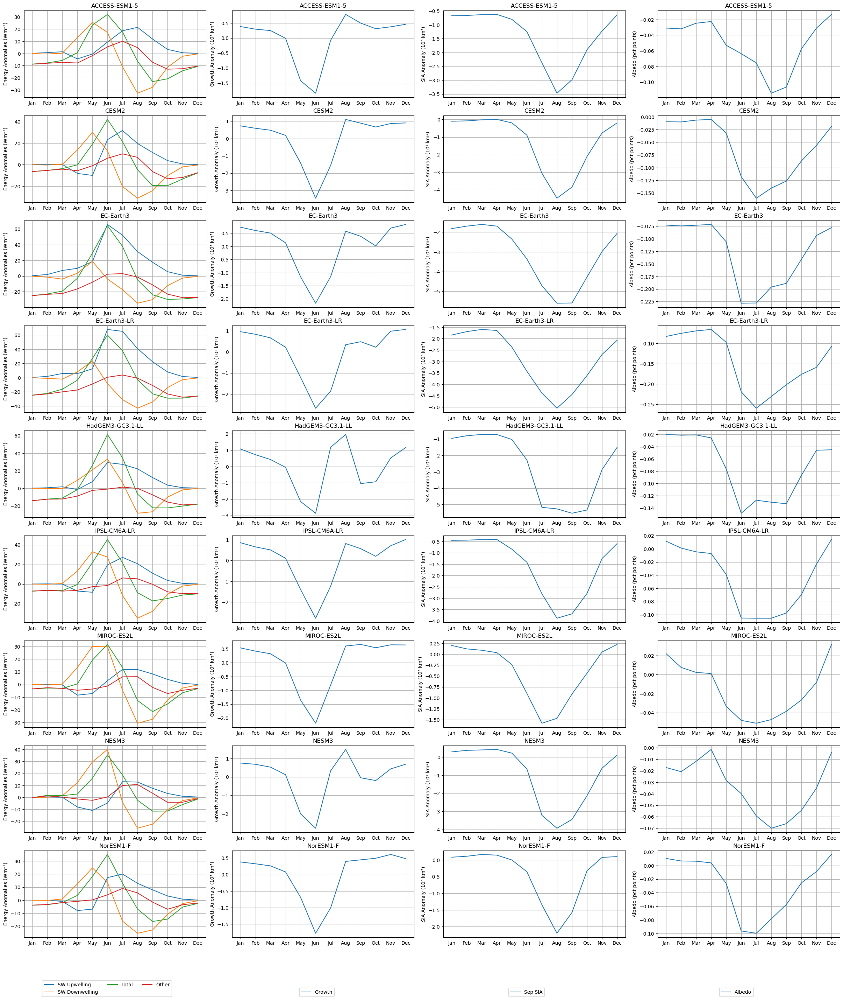

In [57]:
plot_grid(anomaly_energy_dict_3, anomaly_growth_dict, anomaly_si_dict, anomaly_albedo_dict, 
          labels=[['SW Upwelling','SW Downwelling','Total','Other'],['Growth'],['Sep SIA'],['Albedo']], 
          ylabels=['Energy Anomalies (Wm⁻²)', 'Growth Anomaly (10³ km³)', 'SIA Anomaly (10⁶ km²)', 'Albedo (pct points)'])

In [58]:
anomaly_si_dict

{'ACCESS-ESM1-5': {'siconc': array([-0.67064901, -0.66129926, -0.63178441, -0.62360217, -0.80115718,
         -1.24588043, -2.3726286 , -3.47094272, -2.98425939, -1.90029251,
         -1.22400076, -0.64386977])},
 'CESM2': {'siconc': array([-0.09923833, -0.07797236, -0.01942543,  0.00495434, -0.19060415,
         -0.89248921, -3.06677302, -4.48975381, -3.8532462 , -2.10793208,
         -0.76688598, -0.19356788])},
 'EC-Earth3': {'siconc': array([-1.81833192, -1.69232339, -1.60585587, -1.69232219, -2.34876389,
         -3.35934906, -4.71582972, -5.60293069, -5.59131881, -4.27181587,
         -2.98169769, -2.06169843])},
 'EC-Earth3-LR': {'siconc': array([-1.84439948, -1.69563801, -1.59966636, -1.64397803, -2.3696509 ,
         -3.43026187, -4.38427641, -5.04429697, -4.44463402, -3.61524914,
         -2.6941423 , -2.07446566])},
 'HadGEM3-GC3.1-LL': {'siconc': array([-0.96299552, -0.8023978 , -0.7231218 , -0.72568499, -1.03033843,
         -2.28568473, -5.17437455, -5.26875659, -5.534554

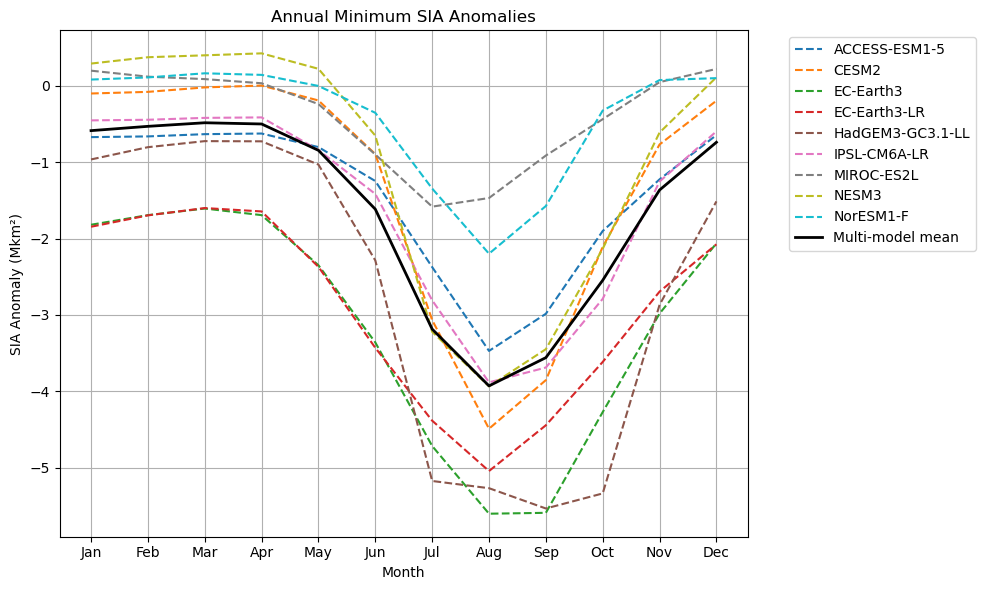

In [59]:
sia_mmm = plot_multi_model_mean(anomaly_si_dict, 'siconc', title='Annual Minimum SIA Anomalies', ylabel = 'SIA Anomaly (Mkm²)', save_name = 'sia_anomaly')

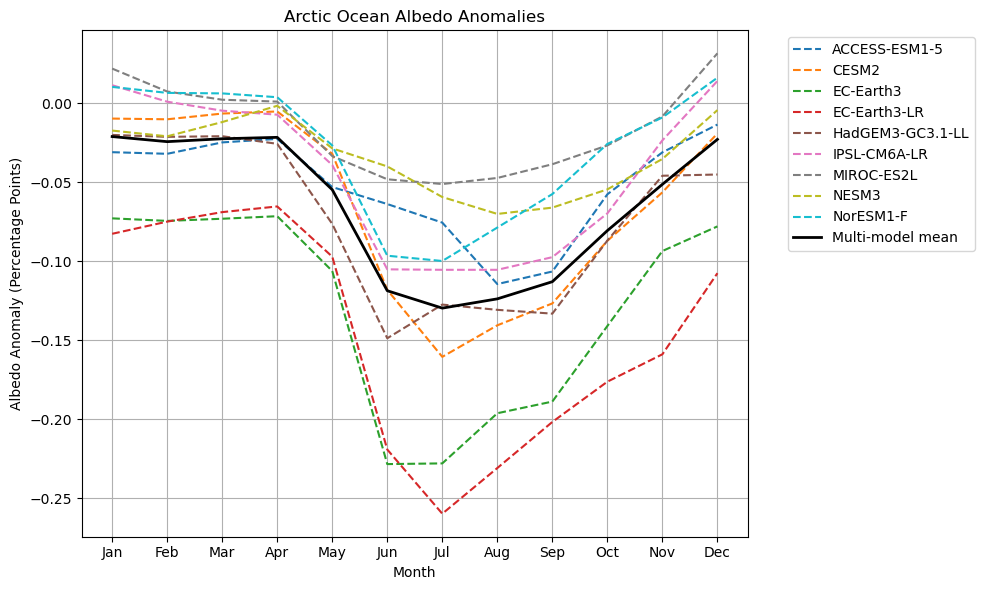

In [60]:
albedo_mmm = plot_multi_model_mean(anomaly_albedo_dict, 'area_albedo', title='Arctic Ocean Albedo Anomalies', ylabel = 'Albedo Anomaly (Percentage Points)', save_name = 'albedo_mmm')

In [61]:
albedo_mmm

array([-0.0209939 , -0.02421333, -0.02238497, -0.0214883 , -0.05463922,
       -0.11862547, -0.12963186, -0.12377008, -0.11289525, -0.08054096,
       -0.05123703, -0.02276514])

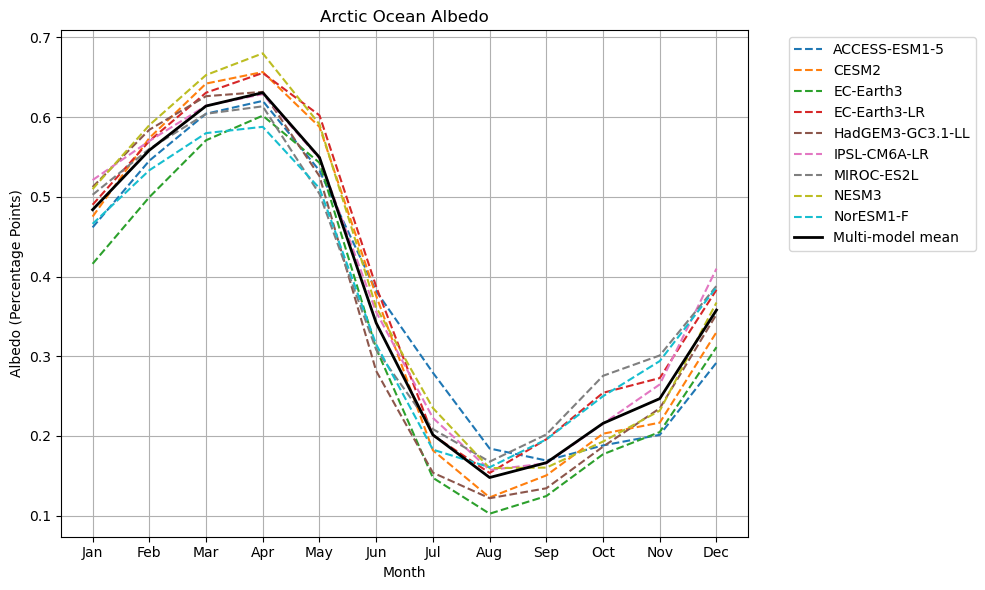

In [62]:
albedo_experiment_mmm = plot_multi_model_mean(experiment_albedo_dict, 'area_albedo', title='Arctic Ocean Albedo', ylabel = 'Albedo (Percentage Points)')

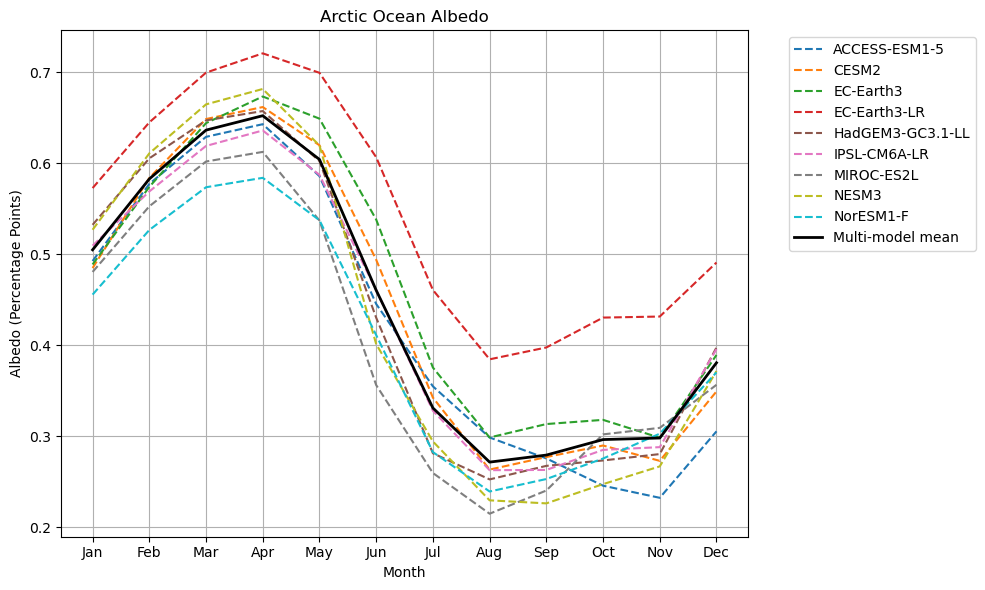

In [63]:
albedo_control_mmm = plot_multi_model_mean(control_albedo_dict, 'area_albedo', title='Arctic Ocean Albedo', ylabel = 'Albedo (Percentage Points)')

In [64]:
albedo_experiment_mmm

array([0.4838578 , 0.55848479, 0.61394535, 0.63067536, 0.54947662,
       0.34177926, 0.20145093, 0.14788388, 0.16647776, 0.21588099,
       0.24688635, 0.35798555])

In [65]:
albedo_control_mmm

array([0.5048517 , 0.58269811, 0.63633032, 0.65216366, 0.60411584,
       0.46040473, 0.33108279, 0.27165396, 0.27937301, 0.29642195,
       0.29812338, 0.38075069])

In [66]:
0.27165396/0.14788388

1.8369409836961272

In [86]:

import math
import string

def plot_multi_model_grid(
    nested_dicts,                 # list of dicts: each {model: {variable: array}}
    variables,                    # list of variable names; paired with nested_dicts
    titles,
    ylabels,
    dict_labels=None,             # optional labels per dict (paired)
    var_labels=None,              # optional pretty labels per variable (paired)
    months=("Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"),
    ncols=None,                   # optional number of columns; auto if None
    figsize_per_cell=(8, 6),  # width, height per subplot
    legend=True,                  # single legend at bottom
    save_name=None                # optional: filename stem
):
    # --- pairwise length handling with broadcasting ---
    nd = len(nested_dicts)
    nv = len(variables)
    if nd == 0 or nv == 0:
        raise ValueError("Provide at least one dict and one variable.")
    if nd == 1 and nv > 1:
        nested_dicts = nested_dicts * nv
    elif nv == 1 and nd > 1:
        variables = variables * nd
    elif nd != nv:
        raise ValueError(f"Lengths must match or broadcastable (got {nd} dicts, {nv} variables).")

    N = len(variables)

    letters = list(string.ascii_lowercase)
    
    # --- labels (paired) ---
    if dict_labels is None:
        dict_labels = [f"Dataset {i+1}" for i in range(N)]
    if var_labels is None:
        var_labels = [str(v) for v in variables]

    # --- collect all model names across all dicts for consistent coloring ---
    all_models = []
    for d in nested_dicts:
        for m in d.keys():
            if m not in all_models:
                all_models.append(m)
    n_models = len(all_models)

    # choose a categorical colormap
    cmap_name = 'tab10' if n_models <= 10 else 'tab20'
    cmap = plt.cm.get_cmap(cmap_name, n_models)

    # --- grid shape ---
    if ncols is None:
        ncols = int(math.ceil(math.sqrt(N)))  # near-square
    nrows = int(math.ceil(N / ncols))

    fig_w = max(1, ncols) * figsize_per_cell[0]
    fig_h = max(1, nrows) * figsize_per_cell[1]
    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), sharex=False, sharey=False)
    axes = np.atleast_2d(axes)

    # --- plotting loop (pairwise) ---
    means = []
    for idx in range(N):
        r = idx // ncols
        c = idx % ncols
        ax = axes[r, c]

        dataset = nested_dicts[idx]
        var = variables[idx]
        title_left = dict_labels[idx]
        title_right = var_labels[idx]
        letter = letters[idx]

        model_data = []
        first_len = None

        for k, model in enumerate(all_models):
            var_dict = dataset.get(model, {})
            if var not in var_dict:
                continue
            y = np.asarray(var_dict[var])
            if first_len is None:
                first_len = len(y)

            model_data.append(y)
            ax.plot(
                y,
                label=model,
                color=cmap(k),
                #linestyle='--',
                linewidth=1.2
            )

        # mean
        if model_data:
            A = np.vstack(model_data)
            mean = A.mean(axis=0)
            means.append(mean)
            ax.plot(mean, color='black', linewidth=2.8, label='Multi-model mean')
        else:
            means.append(None)
            ax.text(0.5, 0.5, f"No data for '{var}'", ha='center', va='center', transform=ax.transAxes)

        # ticks: use months if 12; else numeric indices
        if first_len is None:
            first_len = 12
        x = np.arange(first_len)
        ax.set_xticks(x)
        if first_len == 12 and months is not None:
            ax.set_xticklabels(months, fontsize = 14)
        else:
            ax.set_xticklabels([str(i+1) for i in x])

        # small aesthetics
        ax.grid(True, alpha=0.3)
        ax.set_title(titles[idx], fontsize=16)
        ax.set_ylabel(ylabels[idx], fontsize=14)

    # hide any unused axes (when N < nrows*ncols)
    total_cells = nrows * ncols
    for idx in range(N, total_cells):
        r = idx // ncols
        c = idx % ncols
        axes[r, c].set_visible(False)


        # --- panel lettering ---
    for idx in range(N):
        r = idx // ncols
        c = idx % ncols
        ax = axes[r, c]
        if not ax.get_visible():
            continue
        letter = letters[idx]
        # place just outside top-left of the axis
        ax.annotate(
            letter,
            xy=(0, 1.02), xycoords="axes fraction",
            ha="left", va="bottom",
            fontsize=16, fontweight="bold"
        )
        
    # --- single shared legend at bottom ---
    if legend:
        handles = [Line2D([0],[0], color=cmap(k), linestyle='-', linewidth=1.6) for k in range(n_models)]
        labels = list(all_models)
        handles.append(Line2D([0],[0], color='black', linewidth=2.2))
        labels.append('Multi-model mean')

        fig.legend(handles, labels, loc='lower center', ncol=min(len(labels), 5), frameon=True, fontsize=14)
        plt.subplots_adjust(bottom=0.1)

    
    if save_name is not None:
        plt.savefig('/home/users/matt/plots/' + save_name + '.png', dpi=200, bbox_inches='tight')

    plt.show()
    return means


In [81]:
anomaly_albedopct_dict = {
    model: {"area_albedo": data["area_albedo"] * 100}
    for model, data in anomaly_albedo_dict.items()
}

In [69]:
# dict_to_plot = [anomaly_energy_dict, anomaly_si_dict, anomaly_energy_dict, anomaly_albedopct_dict]
# var_to_plot = ['total', 'siconc', 'rsds', 'area_albedo']
# titles = [r"$Q_{\mathit{atmos}}$ Anomaly",
#           'SIA Anomaly',
#           'SW Downwelling Anomaly',
#           'Albedo Anomaly']
# ylabels = ['Energy Anomaly (Wm⁻²)',
#            'SIA Anomaly (Mkm²)',
#            'Energy Anomaly (Wm⁻²)',
#            'Albedo Anomaly (Pct Points)']

dict_to_plot = [anomaly_si_dict, anomaly_energy_dict, anomaly_energy_dict, anomaly_albedopct_dict]
var_to_plot = ['siconc', 'rsds', 'total', 'area_albedo']
titles = ['SIA Anomaly',
          'SW Downwelling Anomaly',
           r"$Q_{\mathit{atmos}}$ Anomaly",
          'Albedo Anomaly']
ylabels = ['SIA Anomaly (Mkm²)',
           'Energy Anomaly (Wm⁻²)',
           'Energy Anomaly (Wm⁻²)',
           'Albedo Anomaly (Pct Points)']

/tmp/ipykernel_838306/4132822861.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, n_models)


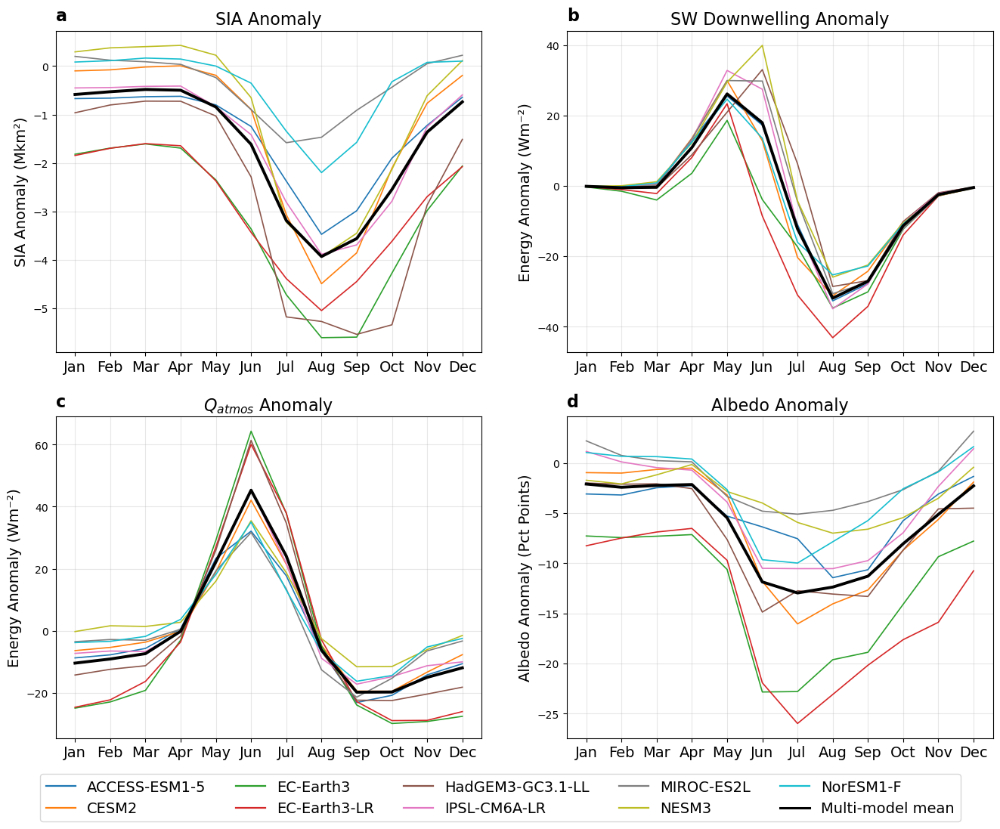

In [87]:
means = plot_multi_model_grid(dict_to_plot, var_to_plot, titles, ylabels, save_name = 'energy_anomaly_grid')

In [71]:
def multi_model_stats(data, variable, func):
    """
    Compute multi-model statistics for a given variable and function.

    Parameters
    ----------
    data : dict
        Nested dictionary of the form {model: {variable: np.array}}.
    variable : str
        Name of the variable (key inside each model dict).
    func : callable
        Function to apply to each model's array (e.g. np.max, np.min, np.sum).

    Returns
    -------
    dict
        {
          "multi_model_mean": float,
          "max_value": float,
          "max_model": str,
          "min_value": float,
          "min_model": str
        }
    """
    results = {}
    values = {}

    for model, vars_dict in data.items():
        arr = vars_dict[variable]
        val = func(arr)
        values[model] = val

    # compute stats
    multi_model_mean = np.mean(list(values.values()))
    max_model = max(values, key=values.get)
    min_model = min(values, key=values.get)

    return {
        "multi_model_mean": multi_model_mean,
        "max_value": values[max_model],
        "max_model": max_model,
        "min_value": values[min_model],
        "min_model": min_model,
    }


In [72]:
stats_temp = multi_model_stats(anomaly_energy_dict, 'total', np.max)

In [73]:
stats_temp

{'multi_model_mean': np.float64(45.27178012001261),
 'max_value': np.float64(64.29305677829802),
 'max_model': 'EC-Earth3',
 'min_value': np.float64(31.64042068901718),
 'min_model': 'MIROC-ES2L'}

In [74]:
stats = multi_model_stats(anomaly_energy_dict_2, 'lw_total', np.min)

In [75]:
stats

{'multi_model_mean': np.float64(-5.229297223166167),
 'max_value': np.float64(-2.2426587779086162),
 'max_model': 'MIROC-ES2L',
 'min_value': np.float64(-9.389872492088983),
 'min_model': 'EC-Earth3-LR'}

In [76]:
for model, var in experiment_albedo_dict.items():
    print(model, end = " ")
    #print(var)
    #print(np.max( experiment_albedo_dict[model]['area_albedo']), end = " ")

    print(np.min( experiment_albedo_dict[model]['area_albedo']))

ACCESS-ESM1-5 0.16925302831918387
CESM2 0.12293214560243025
EC-Earth3 0.10250214243743201
EC-Earth3-LR 0.15366038794019385
HadGEM3-GC3.1-LL 0.12193710747496152
IPSL-CM6A-LR 0.15742516576746096
MIROC-ES2L 0.16776829056022177
NESM3 0.15967349268455566
NorESM1-F 0.1607545879348917


In [77]:
experiment_si_dict

{'ACCESS-ESM1-5': {'siconc': array([11.42864021, 11.86332323, 11.99663615, 11.71418729, 10.47725743,
          8.36106491,  5.21571315,  2.33038835,  2.47665895,  4.81036699,
          7.50311752, 10.22226294])},
 'CESM2': {'siconc': array([12.56215049, 12.88523969, 12.99732548, 12.78532694, 11.57147198,
          9.32405321,  4.98810681,  1.49340222,  1.68955856,  5.52082752,
          9.39263442, 11.61954629])},
 'EC-Earth3': {'siconc': array([11.65956272, 11.99621793, 12.09977373, 11.7778012 , 10.11944666,
          7.03921728,  3.50243109,  1.21195977,  2.23664245,  5.51471568,
          8.71935566, 10.86167371])},
 'EC-Earth3-LR': {'siconc': array([12.65964068, 12.92233195, 13.01378585, 12.78541518, 11.28663723,
          8.3289976 ,  5.36895177,  3.49426627,  5.06675169,  7.7545513 ,
         10.40720483, 12.02837581])},
 'HadGEM3-GC3.1-LL': {'siconc': array([12.01105681, 12.51676041, 12.67308899, 12.46343887, 11.24421564,
          8.14452368,  2.65677308,  0.43356806,  0.319887

In [78]:
anomaly_energy_dict['EC-Earth3']['total']

array([-24.94304881, -22.94283927, -19.22287719,  -2.99942478,
        29.18126648,  64.29305678,  37.83540371,  -4.8807594 ,
       -23.93085471, -29.89063257, -29.24417633, -27.58473153])

In [79]:
experiment_energy2_dict

NameError: name 'experiment_energy2_dict' is not defined